In [524]:
library(ggplot2)
library(dplyr)
library(Matrix)
library(data.table)
library(stringr)
library(patchwork)
library(glue)
library(ggforce)
library(vcfR)
library(purrr)
library(magrittr)
library(parallel)
library(ggpubr)
library(tidygraph)
library(extraDistr)
library(ggrepel)
library(IRdisplay)
library(igraph)
library(ggridges)
library(ggtree)
R.utils::sourceDirectory('~/Numbat/R')
options(repr.matrix.max.cols=30, repr.matrix.max.rows=20)
options(repr.vector.max.items = 50)

In [1498]:
# gtf
gtf = fread('~/ref/hg38.refGene.gtf')
cols = c('CHROM', 'source', 'biotype', 'start', 'end', 'a', 'strand', 'b', 'info')
colnames(gtf) = cols

gtf = gtf %>% filter(CHROM %in% paste0('chr', c(1:22, 'X', 'Y')))

# transcript GTF
gtf_transcript = gtf %>% filter(biotype == 'transcript') %>% distinct(start, end, `.keep_all` = TRUE) %>%
    mutate(gene = str_extract(info, '(?<=gene_name \\").*(?=\\";)')) %>%
#     mutate(CHROM = as.integer(str_remove(CHROM, 'chr'))) %>%
    select(gene, start, end, CHROM) %>%
    mutate(region = paste0('chr', CHROM, ':', start, '-', end)) %>%
    mutate(gene_length = end-start) %>%
    arrange(CHROM, gene, -gene_length) %>%
    distinct(gene, .keep_all = TRUE) %>%
    rename(gene_start = start, gene_end = end) %>%
    arrange(CHROM, gene_start)    

In [554]:
# count_mat = list()

# for (sample in c('56203_Primary', '56203_Relapse_1')) {
#     cells = fread(glue('/home/tenggao/external/WASHU/{sample}/{sample}/outs/filtered_feature_bc_matrix/barcodes.tsv.gz'), header = F)$V1
#     cells = paste0(sample, '_', cells)
#     genes = fread(glue('/home/tenggao/external/WASHU/{sample}/{sample}/outs/filtered_feature_bc_matrix/features.tsv.gz'), header = F)$V2
#     count_mat[[sample]] = readMM(glue('/home/tenggao/external/WASHU/{sample}/{sample}/outs/filtered_feature_bc_matrix/matrix.mtx.gz')) %>% as.matrix
#     count_mat[[sample]] = count_mat[[sample]] %>% set_colnames(cells) %>% set_rownames(genes)
# }

In [526]:
con = readRDS('~/external/WASHU/con.rds')

In [527]:
annot = fread('~/external/WASHU/sample_barcode_cell_type_annotation.txt')

cell_annot = annot %>% 
    mutate(sample_id = str_replace(sample_id, '-', '_')) %>%
    mutate(cell = paste0(sample_id, '_', barcode)) %>% 
    split(.$sample_id)

In [528]:
subclusters = fread('~/external/WASHU/plasma_cell_subclsuters_summary.txt')

subclusters = subclusters %>%
    rename(
        sample_id = sample_id_status
    ) %>%
    mutate(sample_id = str_replace(sample_id, '-', '_')) %>%
    mutate(cell = paste0(sample_id, '_', barcode))  %>%
    split(.$sample_id)

In [529]:
patient = '27522'
samples = c('27522_Primary', '27522_Remission', '27522_Relapse_1', '27522_Relapse_2')
df = list()
count_mat = list()
for (sample in samples) {
    
    df[[sample]] = fread(glue('~/external/WASHU/{sample}_allele_counts.tsv'), sep = '\t') %>% 
        mutate(CHROM = factor(as.integer(CHROM)))
    count_mat[[sample]] = as.matrix(t(con$samples[[sample]]$misc$rawCounts))
    
}

Warning message in factor(as.integer(CHROM)):
“NAs introduced by coercion”
Warning message in factor(as.integer(CHROM)):
“NAs introduced by coercion”
Warning message in factor(as.integer(CHROM)):
“NAs introduced by coercion”
Warning message in factor(as.integer(CHROM)):
“NAs introduced by coercion”


# 27522

## All samples

In [126]:
sample = '27522'
samples = c('27522_Primary', '27522_Remission', '27522_Relapse_1', '27522_Relapse_2')

i = 1
out_dir = glue('~/results/{sample}')
joint_post = fread(glue('{out_dir}/joint_post_{i}.tsv'))
exp_post = fread(glue('{out_dir}/exp_post_{i}.tsv'))
allele_post = fread(glue('{out_dir}/allele_post_{i}.tsv'))
bulk0 = fread(glue('{out_dir}/bulk_subtrees_0.tsv'))
geno = fread(glue('{out_dir}/geno_{i}.tsv')) %>% tibble::column_to_rownames('V1')
out_file = glue('{out_dir}/out_{i}.txt')
mut_tree_file = glue('{out_dir}/mut_tree_{i}.gml')
tree_post = readRDS(glue('{out_dir}/tree_post_{i}.rds'))
scistree_out = readRDS(glue('{out_dir}/scistree_out_{i}.rds'))
subtrees = readRDS(glue('{out_dir}/subtrees_{i}.rds'))
clones = readRDS(glue('{out_dir}/clones_{i}.rds'))
bulk_subtrees = fread(glue('{out_dir}/bulk_subtrees_{i}.tsv'))
bulk_clones = fread(glue('{out_dir}/bulk_clones_{i}.tsv'))
# clust = readRDS(glue('{out_dir}/clust.rds'))

In [1131]:
cells = clust$cell_annot %>% filter(cluster == 3) %>% pull(cell)

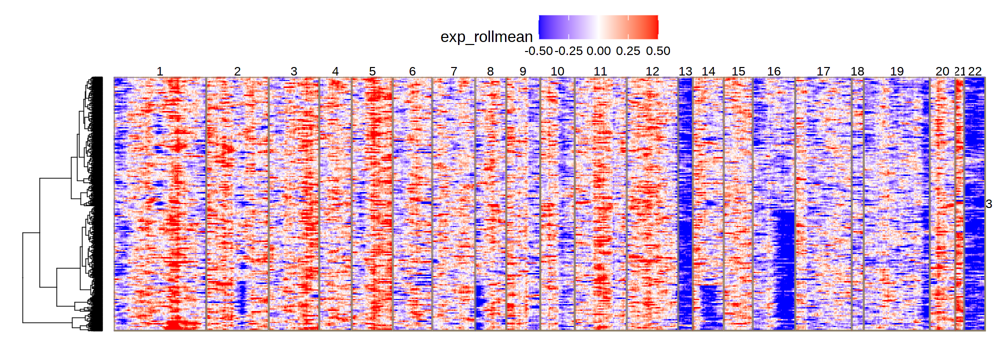

In [1132]:
options(repr.plot.width = 10, repr.plot.height = 3.5, repr.plot.res = 200)

cells = clust$cell_annot %>% filter(cluster == 3) %>% pull(cell)

plot_sc_roll(
    clust$gexp$gexp.norm.long %>% filter(cell %in% cells),
    clust$hc,
    k = 3,
    n_sample = 300,
    lim = 0.5
)

Warning message:
“Removed 269544 rows containing missing values (geom_point).”
Warning message:
“Removed 250971 rows containing missing values (geom_point).”
Warning message:
“Removed 207399 rows containing missing values (geom_point).”
Warning message:
“Removed 188029 rows containing missing values (geom_point).”
Warning message:
“Removed 70635 rows containing missing values (geom_point).”


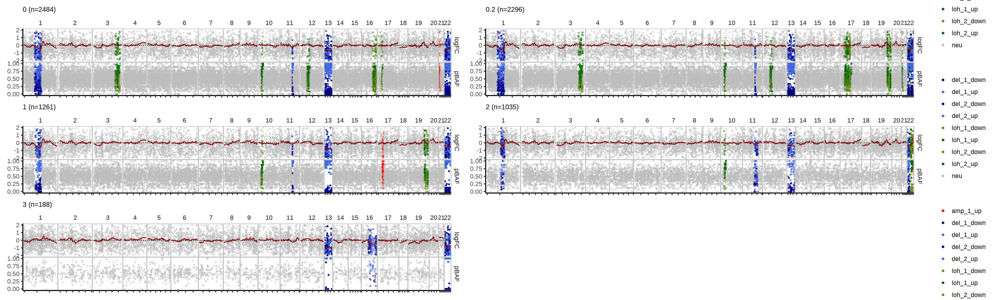

In [1136]:
options(repr.plot.width = 20, repr.plot.height = 6, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

plot_bulks(bulk0, ncol = 2, fc_correct = T)

In [530]:
R.utils::sourceDirectory('~/Numbat/R')

sample = '27522'
samples = c('27522_Primary', '27522_Remission', '27522_Relapse_1', '27522_Relapse_2')

out_dir = glue('~/results/WASHU/{sample}')
res = fetch_results(out_dir, i = 1)

In [183]:
R.utils::sourceDirectory('~/Numbat/R')

clone_post = cell_to_clone(res$gtree, res$exp_post, res$allele_post) 

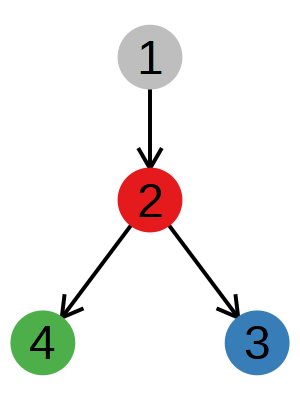

In [261]:
options(repr.plot.width = 1.5, repr.plot.height = 2, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

plot_mut_history(res$G_m, horizontal = F, label = F)

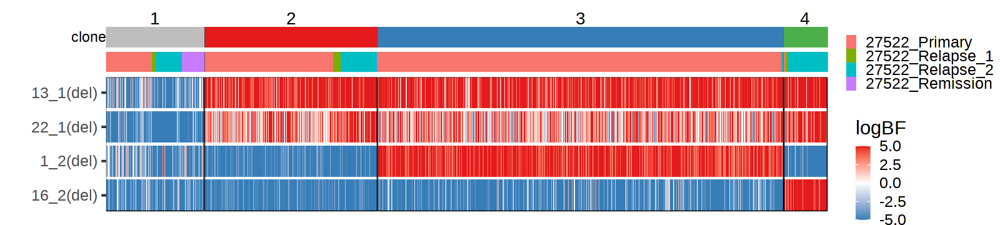

In [269]:
options(repr.plot.width = 8, repr.plot.height = 1.8, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

plot_clone_panel(
    res,
#     label = 'Patient 27522',
    cell_annot = cell_annot[samples] %>% bind_rows %>% mutate(annot = sample_id),
    p_min = 0.9,
    bar_ratio = 0.15,
    tree = FALSE
)

Warning message:
“Removed 269540 rows containing missing values (geom_point).”
Warning message:
“Removed 170204 rows containing missing values (geom_point).”
Warning message:
“Removed 252466 rows containing missing values (geom_point).”
Warning message:
“Removed 58855 rows containing missing values (geom_point).”


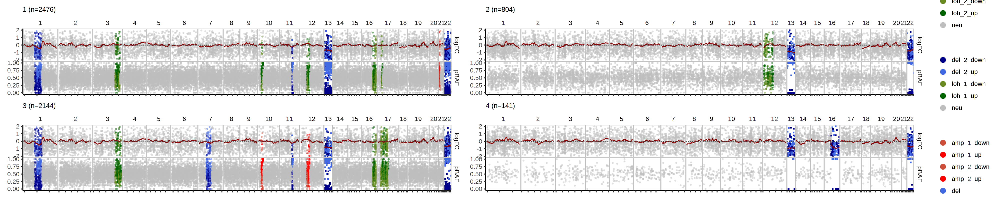

In [1253]:
options(repr.plot.width = 20, repr.plot.height = 4, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

plot_bulks(res$bulk_subtrees, ncol = 2, fc_correct = T)

In [1254]:
res$segs_consensus %>% filter(CHROM == 1)

sample,CHROM,seg,cnv_state,cnv_state_post,seg_start,seg_end,seg_start_index,seg_end_index,theta_mle,theta_sigma,phi_mle,phi_sigma,p_loh,p_del,p_amp,p_bamp,p_bdel,LLR,LLR_y,LLR_x,n_genes,n_snps,component,LLR_sample,seg_length,seg_cons
<int>,<int>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<dbl>,<int>,<chr>
NA,1,,neu,,827591,51786333,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,50958742,1_1
3,1,1_2,del_1,del,51786334,151866247,4049,7001,0.1890697,0.005514391,0.7737613,0.04145883,0.03296484,0.9670352,0,0,2.040505e-112,426.1609,414.7032,11.45775,245,2566,1,426.1609,100079913,1_2
NA,1,,neu,,151866248,248922216,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,97055968,1_3


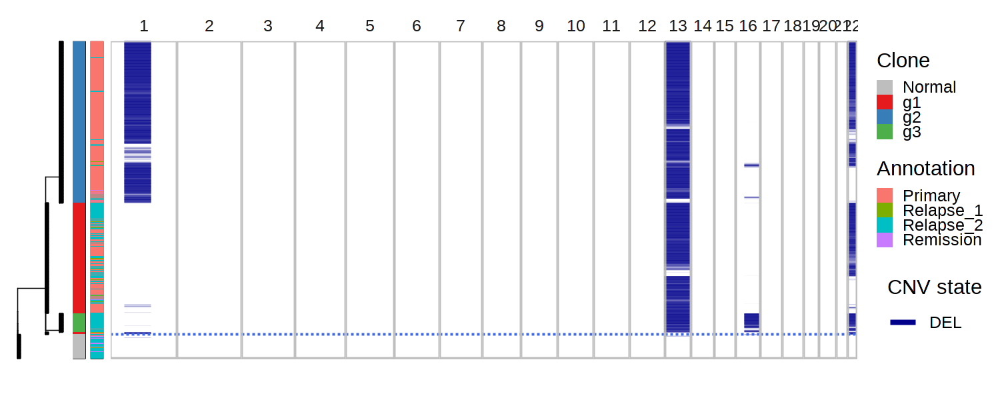

In [2034]:
options(repr.plot.width = 7.5, repr.plot.height = 3, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

plot_sc_joint(
    res$gtree %>% activate(nodes) %>%
        mutate(clone = as.integer(as.factor(GT))) %>%
        mutate(clone = ifelse(clone == 1, 'Normal', paste0('g', clone-1))) %>%
        mutate(clone = factor(clone, c('Normal', 'g1', 'g2', 'g3'))),
    res$joint_post %>% filter(seg %in% colnames(res$geno)),
    res$segs_consensus,
    cell_dict = cell_annot[samples] %>% bind_rows %>%
        mutate(sample_id = str_remove(sample_id,'27522_')) %>%
        {setNames(.$sample_id, .$cell)},
    tip_length = 0.2,
#     logBF_min = 0,
    p_min = 0.5,
    size = 0.05,
    clone_bar = TRUE,
    pal_clone = c('gray', RColorBrewer::brewer.pal(n = 8, 'Set1'))
)

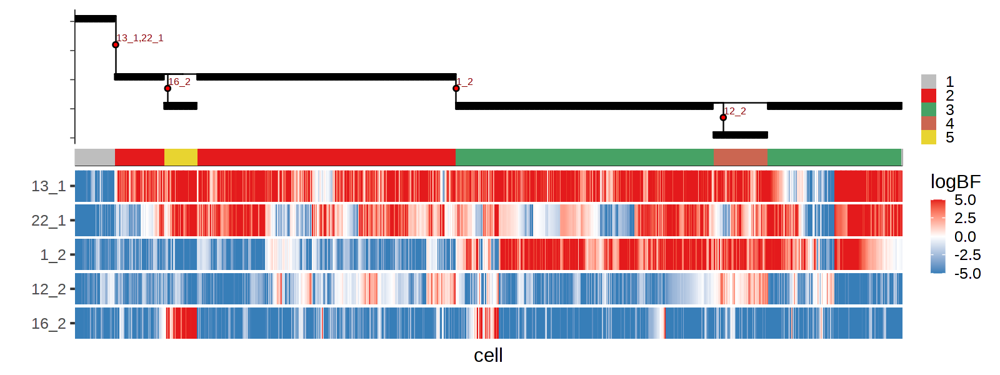

In [370]:
options(repr.plot.width = 8, repr.plot.height = 3, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

tree_heatmap(
    res$joint_post %>% filter(seg %in% colnames(res$geno)),
    res$gtree,
    branch_width = 0.3,
    tip = F,
    tip_length = 0.1,
    ratio = 0.8,
    tvn = F,
    label_mut = T,
    cnv_type = F
) +
theme(plot.title = element_text(size = 8))

Warning message:
“Removed 25157 rows containing missing values (geom_point).”
Warning message:
“Removed 28864 rows containing missing values (geom_point).”
Warning message:
“Removed 8813 rows containing missing values (geom_point).”


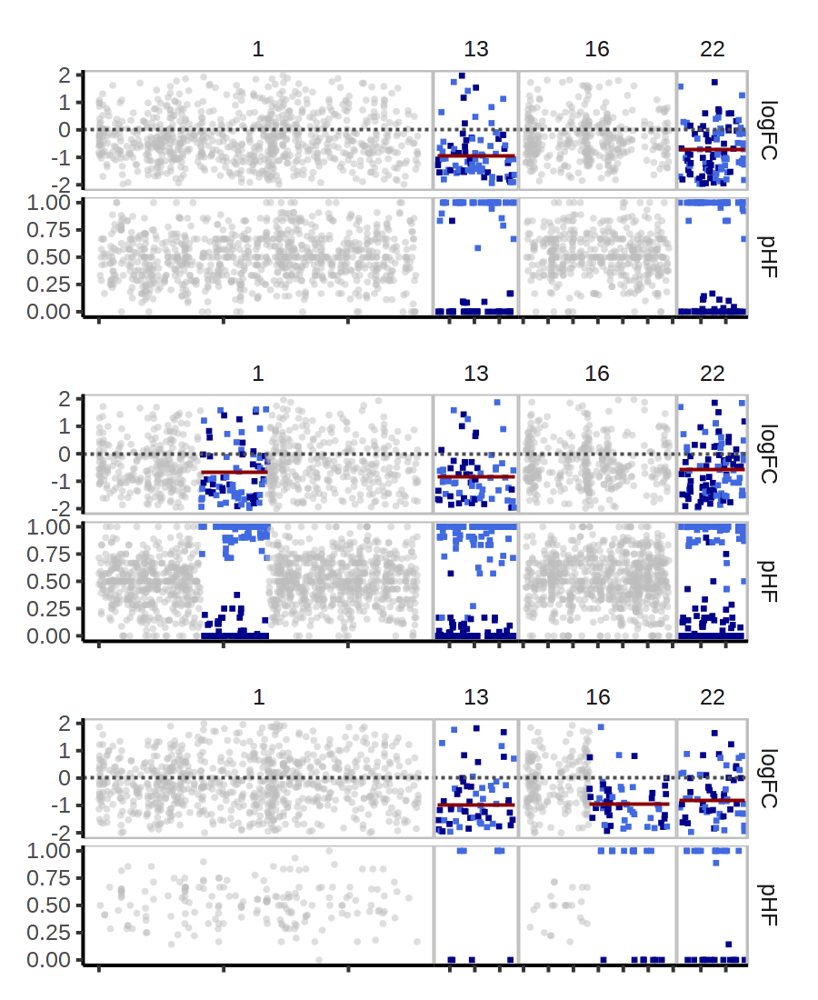

In [2031]:
options(repr.plot.width = 4.5, repr.plot.height = 5.5, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

res$bulk_clones %>%
filter(sample %in% c(2,3,4)) %>%
filter(CHROM %in% c(1,13,16,22)) %>%
plot_bulks(ncol = 1, min_depth = 6, legend = F, phi_mle = TRUE, title = F)

In [520]:
# options(repr.plot.width = 14, repr.plot.height = 8, repr.plot.res = 200)
# R.utils::sourceDirectory('~/Numbat/R')

# res$bulk_clones %>% 
# plot_bulks(ncol = 2)

In [521]:
# options(repr.plot.width = 14, repr.plot.height = 8, repr.plot.res = 200)
# R.utils::sourceDirectory('~/Numbat/R')

# res[[sample]]$bulk_clones %>% 
# mutate(state_post = ifelse(CHROM %in% c(1, 13, 22, 16), state_post, 'neu')) %>%
# mutate(state_post = ifelse(CHROM %in% c(16) & cnv_state == 'amp_1', 'neu', state_post)) %>%
# plot_bulks(ncol = 1)

### CopyKat

In [22]:
patient = '27522'

In [55]:
CNA.test = fread(glue('/home/tenggao/copykat_results/{patient}/27522_copykat_CNA_results.txt'))
pred.test = fread(glue('/home/tenggao/copykat_results/{patient}/{patient}_copykat_prediction.txt'))

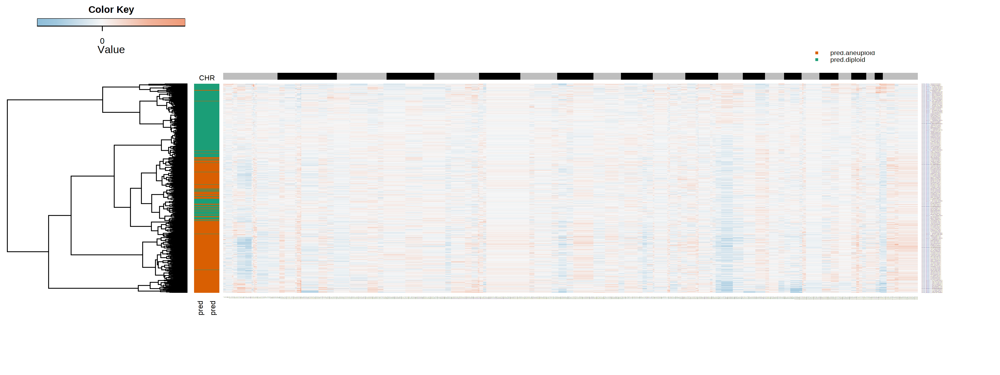

In [58]:
options(repr.plot.width = 16, repr.plot.height = 6, repr.plot.res = 200)

my_palette <- colorRampPalette(rev(RColorBrewer::brewer.pal(n = 3, name = "RdBu")))(n = 999)

chr <- as.numeric(CNA.test$chrom) %% 2+1
rbPal1 <- colorRampPalette(c('black','grey'))
CHR <- rbPal1(2)[as.numeric(chr)]
chr1 <- cbind(CHR,CHR)

rbPal5 <- colorRampPalette(RColorBrewer::brewer.pal(n = 8, name = "Dark2")[2:1])
com.preN <- pred.test$copykat.pred
pred <- rbPal5(2)[as.numeric(factor(com.preN))]

cells <- rbind(pred,pred)
col_breaks = c(seq(-1,-0.4,length=50),seq(-0.4,-0.2,length=150),seq(-0.2,0.2,length=600),seq(0.2,0.4,length=150),seq(0.4, 1,length=50))

copykat::heatmap.3(t(CNA.test[,4:ncol(CNA.test)]),dendrogram="r",
        distfun = function(x) parallelDist::parDist(x,threads =4, method = "euclidean"), hclustfun = function(x) hclust(x, method="ward.D2"),
        ColSideColors=chr1,RowSideColors=cells,Colv=NA, Rowv=TRUE,
        notecol="black",col=my_palette,breaks=col_breaks, key=TRUE,
        keysize=1, density.info="none", trace="none",
        cexRow=0.1,cexCol=0.1,cex.main=1,cex.lab=0.1,
        symm=F,symkey=F,symbreaks=T,cex=1, cex.main=4, margins=c(10,10))

legend("topright", paste("pred.",names(table(com.preN)),sep=""), pch=15,col=RColorBrewer::brewer.pal(n = 8, name = "Dark2")[2:1], cex=0.6, bty="n")

In [ ]:
# options(repr.plot.width = 16, repr.plot.height = 6, repr.plot.res = 200)
# sample = '27522'

# my_palette <- colorRampPalette(rev(RColorBrewer::brewer.pal(n = 3, name = "RdBu")))(n = 999)

# chr <- as.numeric(CNA.test$chrom) %% 2+1
# rbPal1 <- colorRampPalette(c('black','grey'))
# CHR <- rbPal1(2)[as.numeric(chr)]
# chr1 <- cbind(CHR,CHR)

# rbPal5 <- colorRampPalette(RColorBrewer::brewer.pal(n = 8, name = "Dark2")[2:1])
# com.preN <- pred.test$copykat.pred
# pred <- rbPal5(2)[as.numeric(factor(com.preN))]

# cells <- rbind(pred,pred)
# col_breaks = c(seq(-1,-0.4,length=50),seq(-0.4,-0.2,length=150),seq(-0.2,0.2,length=600),seq(0.2,0.4,length=150),seq(0.4, 1,length=50))

# heatmap.3(t(CNA.test[,4:ncol(CNA.test)]),dendrogram="r", 
#           distfun = function(x) parallelDist::parDist(x,threads =4, method = "euclidean"),
#           hclustfun = function(x) hclust(x, method="ward.D2"),
#         ColSideColors=chr1,RowSideColors=cells,Colv=NA, Rowv=TRUE,
#         notecol="black",col=my_palette,breaks=col_breaks, key=TRUE,
#         keysize=1, density.info="none", trace="none",
#         cexRow=0.1,cexCol=0.1,cex.main=1,cex.lab=0.1,
#         symm=F,symkey=F,symbreaks=T,cex=1, cex.main=4, margins=c(10,10))

# legend("topright", paste("pred.",names(table(com.preN)),sep=""), pch=15,col=RColorBrewer::brewer.pal(n = 8, name = "Dark2")[2:1], cex=0.6, bty="n")

### InferCNV

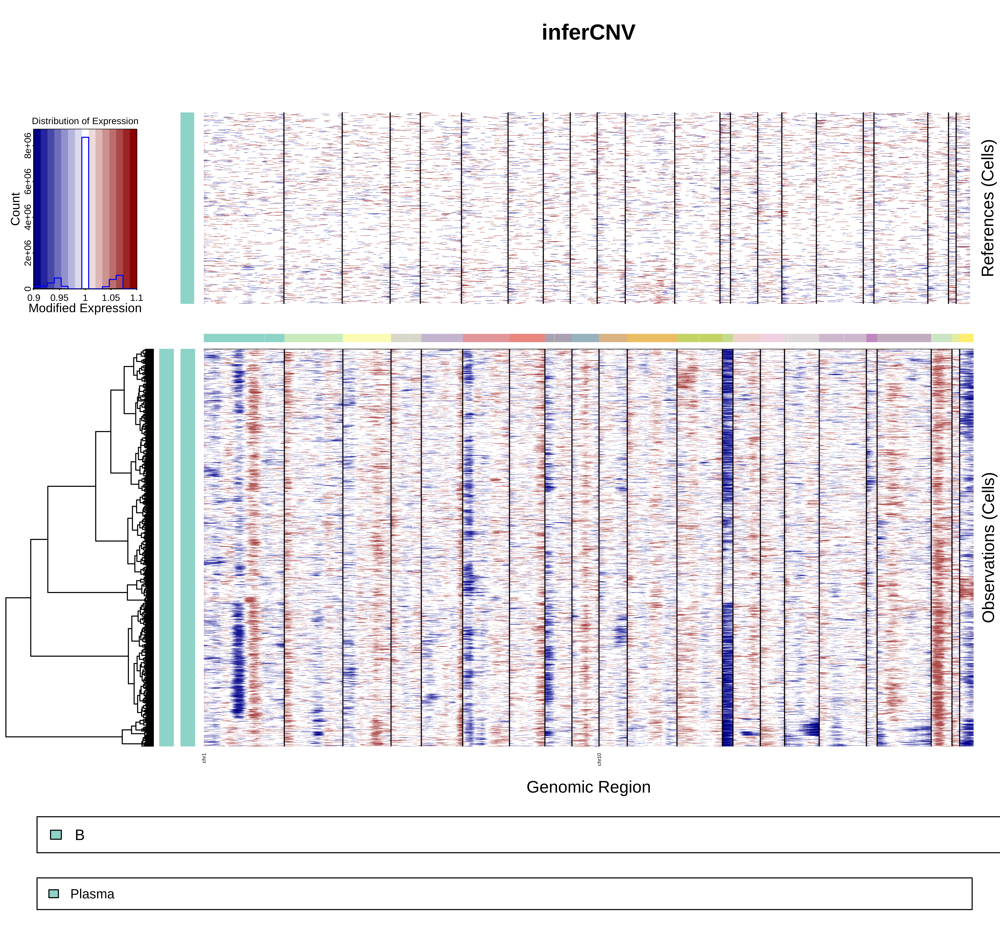

In [1171]:
display_png(file = glue('/home/tenggao/inferCNV/{patient}/infercnv.png'), width = 800)

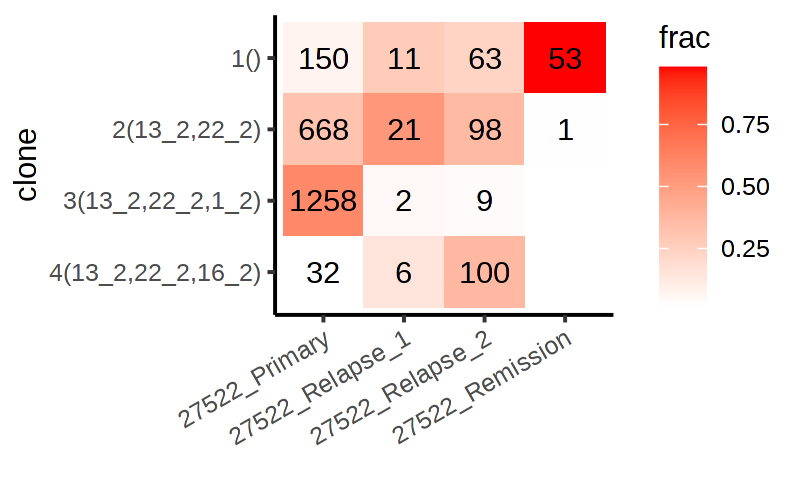

In [129]:
options(repr.plot.width = 4, repr.plot.height = 2.5, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

clone_post = cell_to_clone(gtree, exp_post, allele_post)

clone_post %>% mutate(clone_opt = paste0(clone_opt, '(', GT_opt, ')')) %>%
clone_vs_annot(cell_annot[samples] %>% bind_rows() %>% mutate(cell_type = sample_id))

Joining, by = c("sample_id", "barcode", "cell")

Joining, by = "cell"



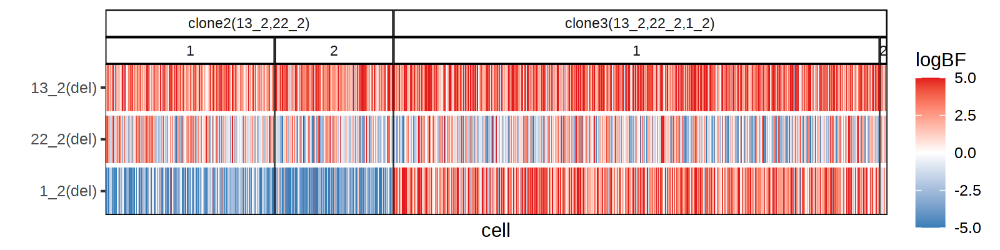

In [1153]:
options(repr.plot.width = 8, repr.plot.height = 2, repr.plot.res = 200)

cells = cell_annot[['27522_Primary']] %>%
    left_join(subclusters[['27522_Primary']]) %>%
    left_join(clone_post) %>%
    filter(cluster %in% c(1,2)) %>%
    pull(cell)

cnv_order = c('13_2', '22_2', '1_2', '16_3')

exp_post %>%
    filter(cell %in% cells) %>%
    mutate(seg_label = paste0(seg, '(', cnv_state, ')')) %>%
    mutate(seg_label = factor(seg_label, unique(seg_label))) %>%
    filter(seg %in% cnv_order) %>%
    mutate(seg = factor(seg, rev(cnv_order))) %>%
    arrange(seg) %>%
    mutate(seg_label = factor(seg_label, unique(seg_label))) %>%
    left_join(bind_rows(cell_annot[samples]), by = 'cell') %>%
    mutate(sample_id = factor(sample_id, samples)) %>%
    mutate(cluster = con_clusters[cell]) %>%
    arrange(sample_id) %>%
    mutate(sample_id = str_remove(sample_id, '27522_')) %>%
    mutate(sample_id = factor(sample_id, unique(sample_id))) %>%
    inner_join(clone_post, by = 'cell') %>%
    filter(sample_id == 'Primary') %>%
    filter(cluster %in% c(1,2) & clone_opt %in% c(2,3)) %>%
    mutate(clone_opt = paste0('clone', clone_opt, '(', GT_opt, ')')) %>%
    ggplot(
        aes(x = cell, y = seg_label, fill = logBF)
    ) +
    geom_tile(width=0.4, height=0.9) +
    theme_classic() +
    scale_y_discrete(expand = expansion(0)) +
    scale_x_discrete(expand = expansion(add = 0.5)) +
    theme(
        panel.spacing = unit(0, 'mm'),
        panel.border = element_rect(size = 0.3, color = 'black', fill = NA),
        axis.line.x = element_blank(),
        axis.line.y = element_blank(),
        axis.ticks.x = element_blank(),
        panel.background = element_rect(fill = 'white'),
        strip.background = element_rect(size = 0.5),
        axis.text.x = element_blank(),
        strip.text = element_text(angle = 0, size = 8, vjust = 0.5)
    ) +
    scale_fill_gradient2(low = pal[2], high = pal[1], midpoint = 0, limits = c(-5, 5), oob = scales::oob_squish) +
    theme(plot.title = element_text(size = 8)) +
    ylab('') +
    ggh4x::facet_nested(~clone_opt+cluster, space = 'free', scale = 'free') 

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



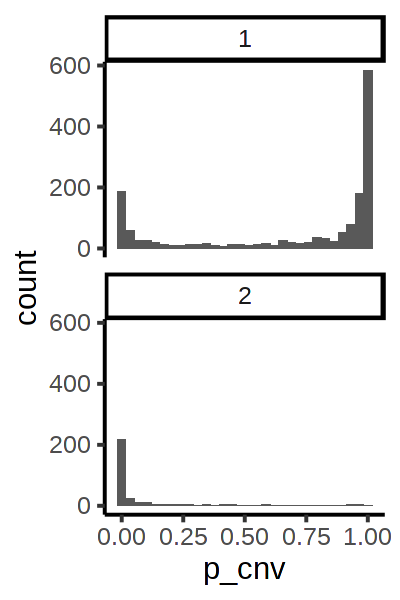

In [1154]:
options(repr.plot.width = 2, repr.plot.height = 3, repr.plot.res = 200)

joint_post %>%
    filter(seg == '1_2') %>%
    filter(cell %in% cells) %>%
    mutate(seg_label = paste0(seg, '(', cnv_state, ')')) %>%
    mutate(seg_label = factor(seg_label, unique(seg_label))) %>%
    filter(seg %in% cnv_order) %>%
    mutate(seg = factor(seg, rev(cnv_order))) %>%
    arrange(seg) %>%
    mutate(seg_label = factor(seg_label, unique(seg_label))) %>%
    left_join(bind_rows(cell_annot[samples]), by = 'cell') %>%
    mutate(sample_id = factor(sample_id, samples)) %>%
    mutate(cluster = con_clusters[cell]) %>%
    filter(!is.na(cluster)) %>%
    arrange(sample_id) %>%
    mutate(sample_id = str_remove(sample_id, '27522_')) %>%
    mutate(sample_id = factor(sample_id, unique(sample_id))) %>%
    inner_join(clone_post, by = 'cell') %>%
    ggplot(
        aes(x = p_cnv)
    ) +
    geom_histogram() +
    theme_classic() +
    facet_wrap(~cluster, ncol = 1)

In [1155]:
sample = '27522_Primary'

cells_no1del = cell_annot[[sample]] %>%
    inner_join(clone_post) %>%
    mutate(cluster = con_clusters[cell]) %>%
    filter(cluster == 1 & clone_opt == 2) %>%
    pull(cell)

cells_1del = cell_annot[[sample]] %>%
    inner_join(clone_post) %>%
    mutate(cluster = con_clusters[cell]) %>%
    filter(cluster == 1 & clone_opt == 3) %>%
    pull(cell)

Joining, by = "cell"

Joining, by = "cell"



In [1168]:
ref_patient = fread(glue('~/results/{patient}/ref_{patient}.tsv')) %>% {setNames(.$ref_patient, .$V1)}

bulk_no1del = get_bulk(
    count_mat[[sample]][,cells_no1del],
    ref_patient,
    df[[sample]] %>% filter(cell %in% cells_no1del),
    gtf_transcript,
    genetic_map,
    verbose = T
)

bulk_1del = get_bulk(
    count_mat[[sample]][,cells_1del],
    ref_patient,
    df[[sample]] %>% filter(cell %in% cells_1del),
    gtf_transcript,
    genetic_map,
    verbose = T
)

[1] "Fitted reference proportions:"

[1] 1

[1] 8542

[1] "Fitted reference proportions:"

[1] 1

[1] 8373

In [1169]:
bulk_no1del = bulk_no1del %>% analyze_bulk_lnpois(t = 1e-4)
bulk_1del = bulk_1del %>% analyze_bulk_lnpois(t = 1e-4)

diploid regions: 1_0,1_2,2_0,3_0,4_0,5_0,6_0,7_0,8_0,9_0,10_2,11_0,11_2,12_0,14_0,15_0,16_0,17_0,18_0,19_0,20_0,21_0

[1] "Retesting CNVs.."

[1] "Finishing.."

diploid regions: 1_0,1_2,1_4,2_0,2_2,3_0,4_0,4_2,5_0,6_0,7_0,8_1,8_3,9_0,10_4,11_0,11_2,11_6,12_2,12_5,14_0,14_2,15_0,16_0,16_4,17_0,17_2,18_0,19_0,19_2,20_0,21_2

[1] "Retesting CNVs.."

[1] "Finishing.."

Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“attributes are not identical across measure variables; they will be dropped”
Warning message:
“Using alpha for a discrete variable is not advised.”
Warning message:
“Removed 8134 rows containing missing values (geom_point).”
Warning message:
“Removed 14944 rows containing missing values (geom_point).”


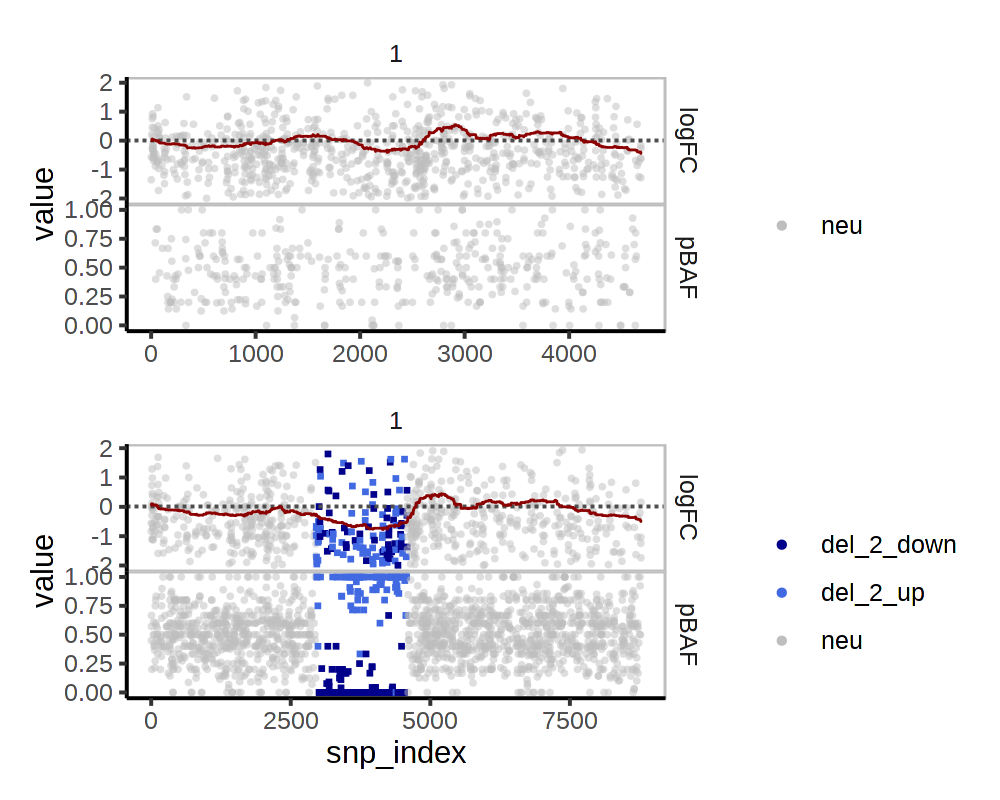

In [1170]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
R.utils::sourceDirectory('~/Numbat/R')

p1 = bulk_no1del %>% filter(CHROM == 1) %>% plot_psbulk(min_depth = 5) + theme(axis.title.x = element_blank())
p2 = bulk_1del %>% filter(CHROM == 1) %>% plot_psbulk(min_depth = 5)

p1/p2

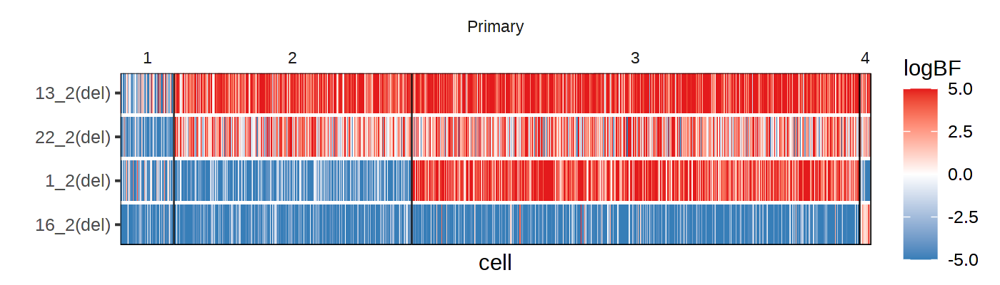

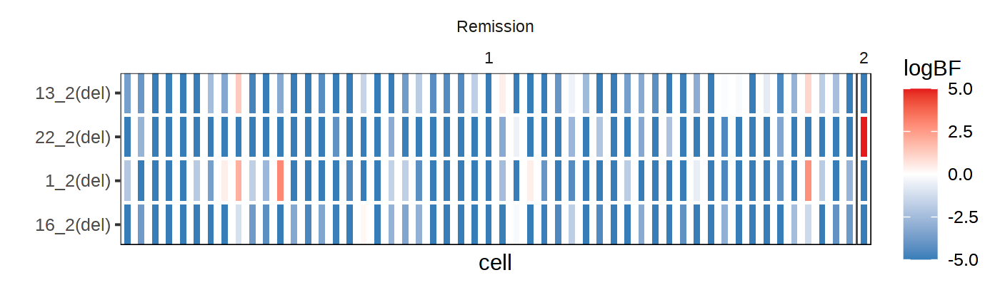

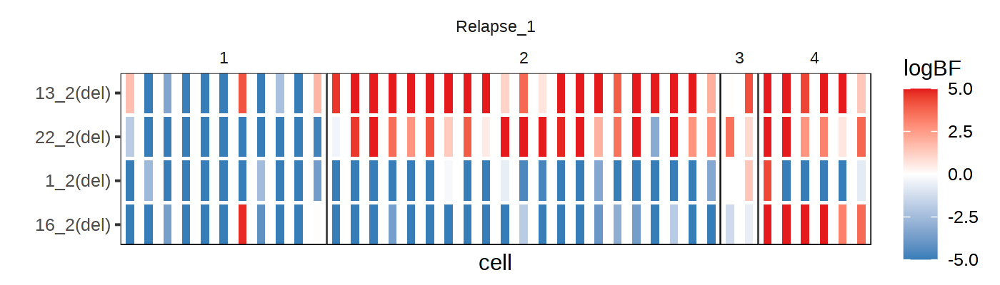

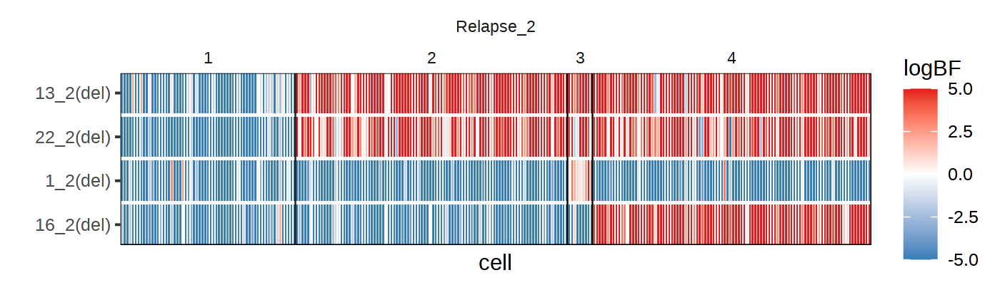

In [1146]:
options(repr.plot.width = 7, repr.plot.height = 2, repr.plot.res = 200)

cnv_order = c('13_2', '22_2', '1_2', '16_2')

for (sample in samples) {
    p = joint_post %>%
        filter(seg %in% cnv_order) %>%
        mutate(seg = factor(seg, rev(cnv_order))) %>%
        arrange(seg) %>%
        mutate(seg_label = factor(seg_label, unique(seg_label))) %>%
        left_join(bind_rows(cell_annot[samples]), by = 'cell') %>%
        mutate(sample_id = factor(sample_id, samples)) %>%
        arrange(sample_id) %>%
        filter(sample_id %in% sample) %>%
        mutate(sample_id = str_remove(sample_id, '27522_')) %>%
        mutate(sample_id = factor(sample_id, unique(sample_id))) %>%
        inner_join(clone_post, by = 'cell') %>%
        ggplot(
            aes(x = cell, y = seg_label, fill = logBF)
        ) +
        geom_tile(width=0.4, height=0.9) +
        theme_classic() +
        scale_y_discrete(expand = expansion(0)) +
        scale_x_discrete(expand = expansion(add = 0.5)) +
        theme(
            panel.spacing = unit(0, 'mm'),
            panel.border = element_rect(size = 0.3, color = 'black', fill = NA),
            axis.line.x = element_blank(),
            axis.line.y = element_blank(),
            axis.ticks.x = element_blank(),
        #     panel.border = element_blank(),
            panel.background = element_rect(fill = 'white'),
            strip.background = element_blank(),
            axis.text.x = element_blank(),
            strip.text = element_text(angle = 0, size = 8, vjust = 0.5)
        ) +
        scale_fill_gradient2(low = pal[2], high = pal[1], midpoint = 0, limits = c(-5, 5), oob = scales::oob_squish) +
        # xlab('') +
        theme(plot.title = element_text(size = 8)) +
#         scale_x_discrete(expand = expansion(add = 1)) +
        ylab('') +
        ggh4x::facet_nested(~sample_id+clone_opt, space = 'free', scale = 'free') 
    
    print(p)
}


### DE

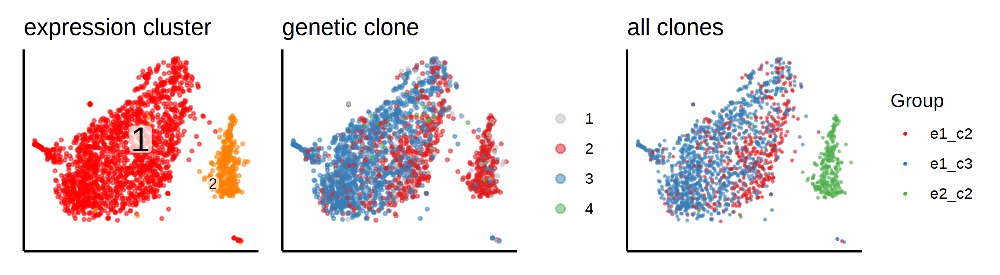

In [2119]:
options(repr.plot.width = 8, repr.plot.height = 2.2, repr.plot.res = 300)

con_sample = con$samples[['27522_Primary']]

con_clusters = con_sample$clusters$PCA$multilevel
con_clusters = con_clusters[names(con_clusters) %in% res$clone_post$cell]
con_clusters[con_clusters %in% c(2,3,8)] = 1
con_clusters[con_clusters %in% c(12)] = 2
con_clusters = con_clusters[con_clusters %in% c(1,2)]

clone_annot = res$clone_post %>%
#     filter(p_opt > 0.5) %>%
    mutate(cluster = con_clusters[cell]) %>%
    filter(!is.na(cluster))

group_annot = clone_annot %>% 
    mutate(group = case_when(
        cluster == 2 & clone_opt == 2 ~ 'e2_c2',
        cluster == 1 & clone_opt == 2 ~ 'e1_c2',
        cluster == 1 & clone_opt == 3 ~ 'e1_c3'
    )) %>%
    filter(!is.na(group))

p1 = con_sample$plotEmbedding(
    alpha=0.5,
    size=0.5, 
    groups = clone_annot %>% {setNames(.$cluster, .$cell)},
    show.legend = F,
    plot.na = F,
    plot.theme = theme_classic(),
    title = 'expression cluster'
) +
guides(color = guide_legend(title = 'cluster'))

p2 = con_sample$plotEmbedding(
    alpha=0.5,
    size=0.5, 
    groups = clone_annot %>% {setNames(.$clone_opt, .$cell)},
    plot.na = F,
    show.legend = T,
    mark.groups = F,
    palette = c('gray', pal[1:3]),
    plot.theme = theme_classic(),
    title = 'genetic clone'
) +
guides(color = guide_legend(title = '', override.aes = list(size = 2)))

p3 = con_sample$plotEmbedding(
    alpha=0.5,
    size=0.2, 
    groups = group_annot %>% {setNames(.$group, .$cell)},
    plot.na = F,
    show.legend = T,
    mark.groups = F,
    palette = pal[1:3],
    plot.theme = theme_classic(),
    title = 'all clones'
) 

p1 | p2 | p3

#### Cluster 1 vs 2

In [2134]:
# cluster1 vs 2
sample = '27522_Primary'

de_annot = clone_annot %>% filter(cluster %in% c(1,2))

con$samples[[sample]]$getDifferentialGenes(
    groups = de_annot %>% {setNames(.$cluster, .$cell)},
    append.auc = T
)

genes = rownames(count_mat[[sample]])[rowSums(count_mat[[sample]][,de_annot$cell] > 1) > 5]

fold_changes = make_psbulk(
        count_mat[[sample]][genes,],
        de_annot %>% mutate(cell_type = factor(cluster, c(1,2)))
    )$exp_mat %>%
    data.frame() %>%
    setNames(c('lambda_x', 'lambda_y')) %>%
    tibble::rownames_to_column('gene') %>%
    mutate(logFC = log2(lambda_x/lambda_y)) %>%
    filter(!is.na(logFC))

Warning message in con$samples[[sample]]$getDifferentialGenes(groups = de_annot %>% :
“cluster vector doesn't specify groups for all of the cells, dropping missing cells from comparison”
1717322



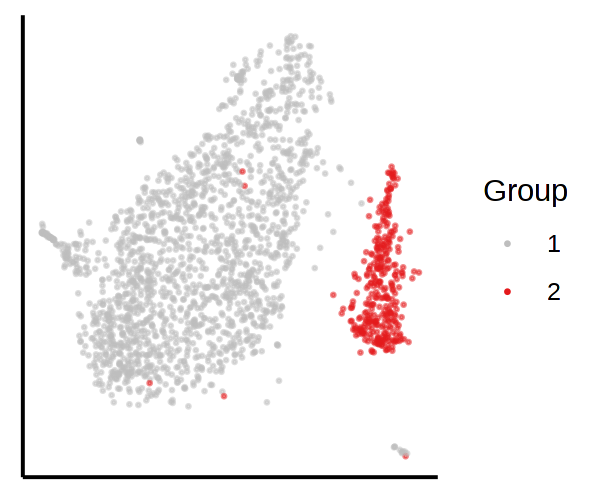

In [2121]:
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 200)

con_sample$plotEmbedding(
    alpha=0.5,
    size=0.2, 
    groups = de_annot %>% {setNames(droplevels(.$cluster), .$cell)},
    plot.na = F,
    show.legend = T,
    mark.groups = F,
    palette = c('gray', pal[1:3]),
    plot.theme = theme_classic(),
) 

Warning message:
“ggrepel: 373 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


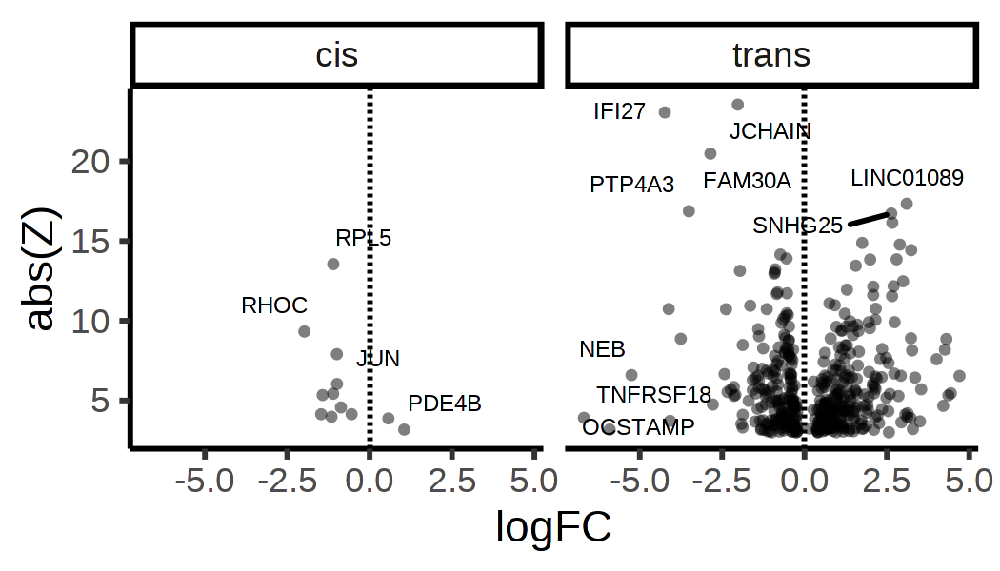

In [2122]:
options(repr.plot.width = 3.5, repr.plot.height = 2, repr.plot.res = 300)

seg_start = 52085411
seg_end = 121518467

DE = con$samples[[sample]]$diffgenes$counts$customClustering[[1]] %>%
    tibble::rownames_to_column('gene') %>%
    inner_join(gtf_transcript, by = 'gene') %>%
    left_join(fold_changes, by = 'gene') %>%
    mutate(loc = ifelse(CHROM == 'chr1' & gene_start < seg_end & gene_end > seg_start, 'cis', 'trans'))

ggplot(
    DE,
    aes(x = logFC, y = abs(Z))
) +
geom_point(size = 1, alpha = 0.5, pch = 16) +
theme_classic() +
scale_color_manual(values = c('gray', 'red')) +
facet_wrap(~loc) +
ggrepel::geom_text_repel(aes(label = gene), size = 2) +
geom_vline(xintercept = 0, linetype = 'dashed')

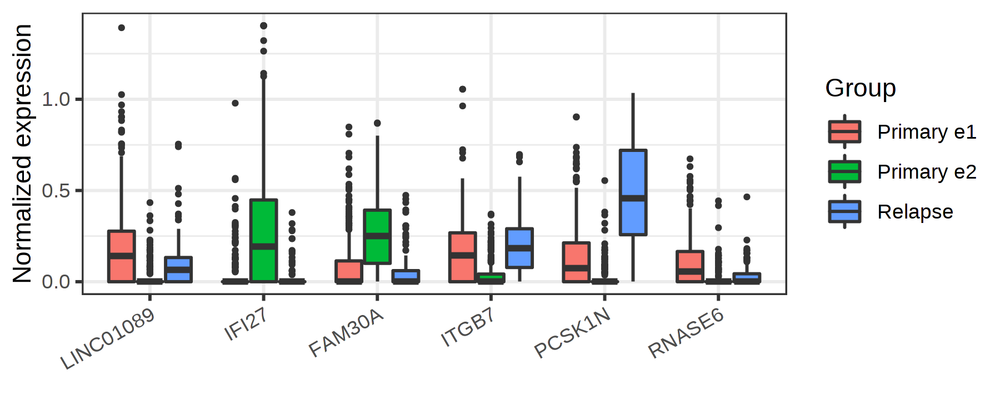

In [2126]:
options(repr.plot.width = 6, repr.plot.height = 2.5, repr.plot.res = 300)

cells = res$clone_post %>% filter(clone_opt == 2) %>% pull(cell)
markers = DE %>% filter(loc == 'trans') %>% arrange(-AUC) %>% head %>% pull(gene)
count_mat_combined[cells, markers] %>%
reshape2::melt() %>%
setNames(c('cell', 'gene', 'exp')) %>%
left_join(bind_rows(cell_annot[samples]), by = 'cell') %>%
mutate(
    cluster = ifelse(sample_id == '27522_Primary', con_clusters[as.character(cell)], sample_id)
) %>%
filter(cell_type == 'Plasma') %>%
filter(cluster %in% c(1,2, c('27522_Relapse_2', '27522_Relapse_1'))) %>%
mutate(cluster = c('1' = 'Primary e1', '2' = 'Primary e2', '27522_Relapse_2' = 'Relapse', '27522_Relapse_1' = 'Relapse')[cluster]) %>%
ggplot(
    aes(x = gene, fill = cluster, y = exp)
) +
geom_boxplot(outlier.size = 0.5) +
theme_bw() +
theme(
    axis.text.x = element_text(angle = 30, hjust = 1)
) +
xlab('') +
ylab('Normalized expression') +
guides(fill = guide_legend(title = 'Group'))

In [1024]:
gsea_out = bulk.gsea(
    values = fold_changes %>% filter(!is.infinite(logFC)) %>% {setNames(.$logFC, .$gene)},
    set.list = h_gene_sets,
    mc.cores = 10
)

In [ ]:
gsea_out %>%
tibble::rownames_to_column('gene.set') %>%
filter(q.val < 0.05) %>%
arrange(q.val, sscore)

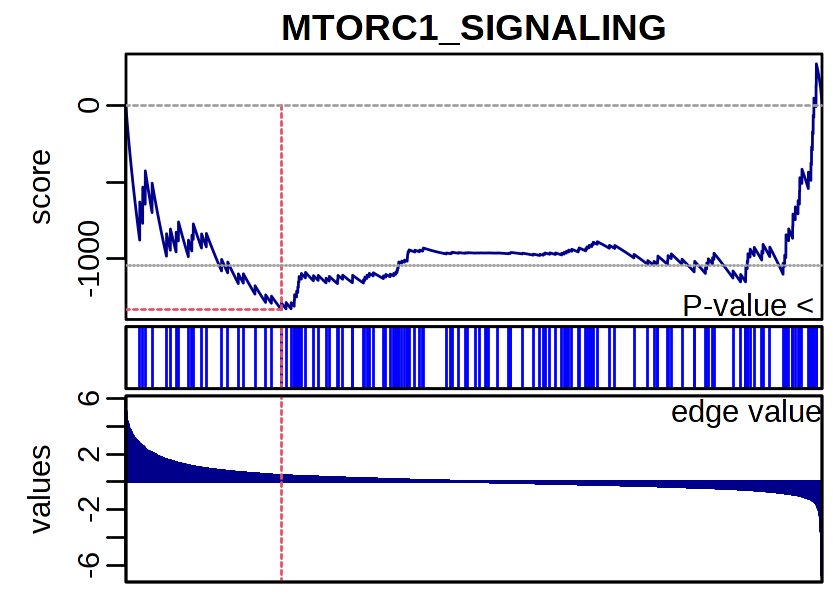

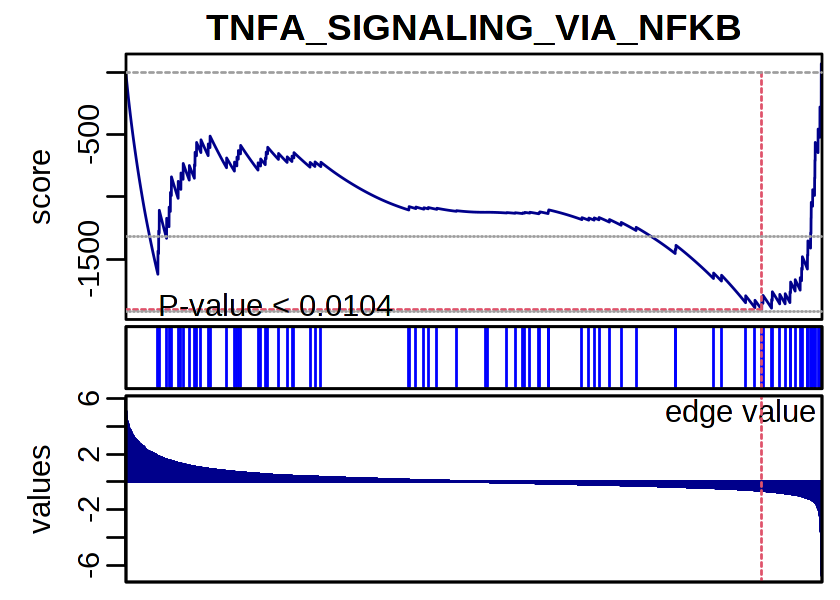

In [1028]:
options(repr.plot.width = 4.2, repr.plot.height = 3, repr.plot.res = 200)

for (gs in c('MTORC1_SIGNALING', 'TNFA_SIGNALING_VIA_NFKB')) {

    gsea(
        fold_changes %>% filter(!is.infinite(logFC)) %>% {setNames(.$logFC, .$gene)},
        h_gene_sets[[gs]],
        main = str_remove(gs, 'HALLMARK_')
    )
    
}

#### **Restrict to clone 2**

In [2135]:
# cluster1 vs 2
sample = '27522_Primary'

de_annot = group_annot %>% filter(group %in% c('e2_c2', 'e1_c2'))

con$samples[[sample]]$getDifferentialGenes(
    groups = de_annot %>% {setNames(.$group, .$cell)}
)

fold_changes = make_psbulk(
        count_mat[[sample]],
        de_annot %>% mutate(cell_type = factor(group, c('e2_c2', 'e1_c2')))
    )$exp_mat %>%
    data.frame() %>%
    setNames(c('lambda_x', 'lambda_y')) %>%
    tibble::rownames_to_column('gene') %>%
    mutate(logFC = log2(lambda_x/lambda_y)) %>%
    filter(!is.na(logFC))

Warning message in con$samples[[sample]]$getDifferentialGenes(groups = de_annot %>% :
“cluster vector doesn't specify groups for all of the cells, dropping missing cells from comparison”
250430



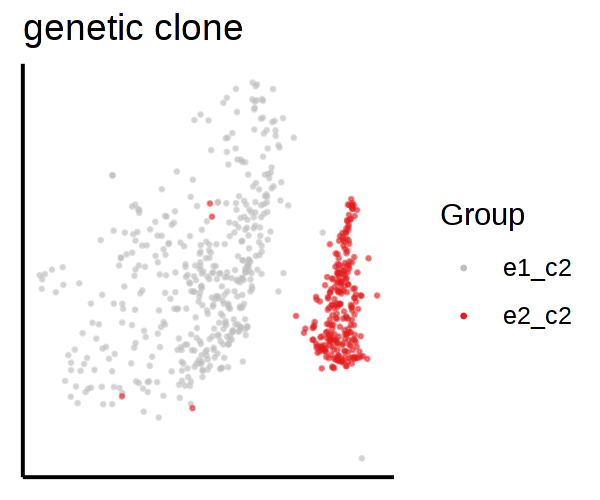

In [2138]:
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 200)

con_sample$plotEmbedding(
    alpha=0.5,
    size=0.2, 
    groups = de_annot %>% {setNames(factor(.$group), .$cell)},
    plot.na = F,
    show.legend = T,
    mark.groups = F,
    palette = c('gray', pal[1:3]),
    plot.theme = theme_classic(),
    title = 'genetic clone'
)

In [2139]:
expressed_genes = rownames(count_mat[[sample]])[rowSums(count_mat[[sample]][,de_annot$cell] > 0) >= 5]

gsea_out = bulk.gsea(
    values = fold_changes %>% 
        filter(gene %in% expressed_genes) %>%
        filter(!is.infinite(logFC)) %>% 
        {setNames(.$logFC, .$gene)},
    set.list = h_gene_sets,
    mc.cores = 10
)

In [2140]:
gsea_out %>%
tibble::rownames_to_column('gene.set') %>%
filter(q.val < 0.05 & sscore * edge > 0) %>%
arrange(q.val, -sscore)

gene.set,p.val,q.val,sscore,edge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
TNFA_SIGNALING_VIA_NFKB,0.00009999,0.0002777778,1.4504340,1.108224
CHOLESTEROL_HOMEOSTASIS,0.00019998,0.0007923077,1.3192563,0.988287
IL2_STAT5_SIGNALING,0.01259874,0.0314476190,0.9762717,1.151293


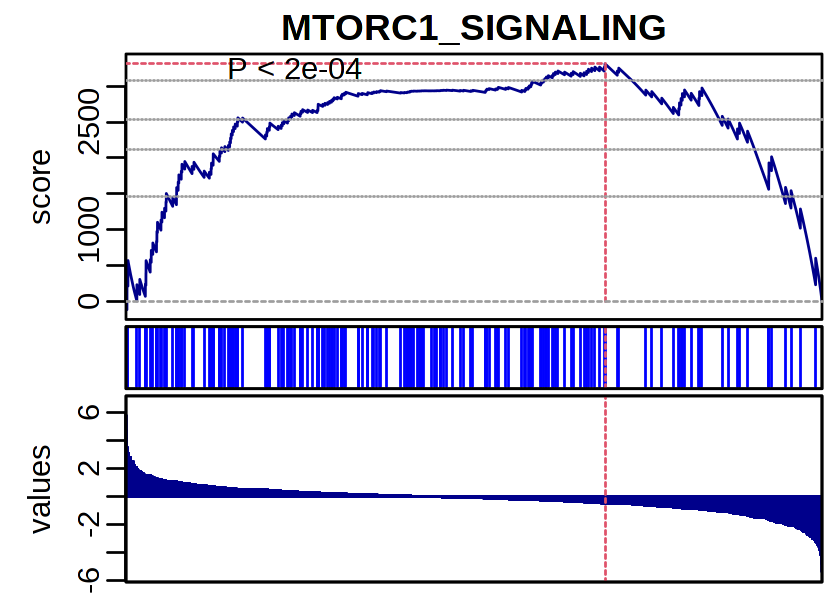

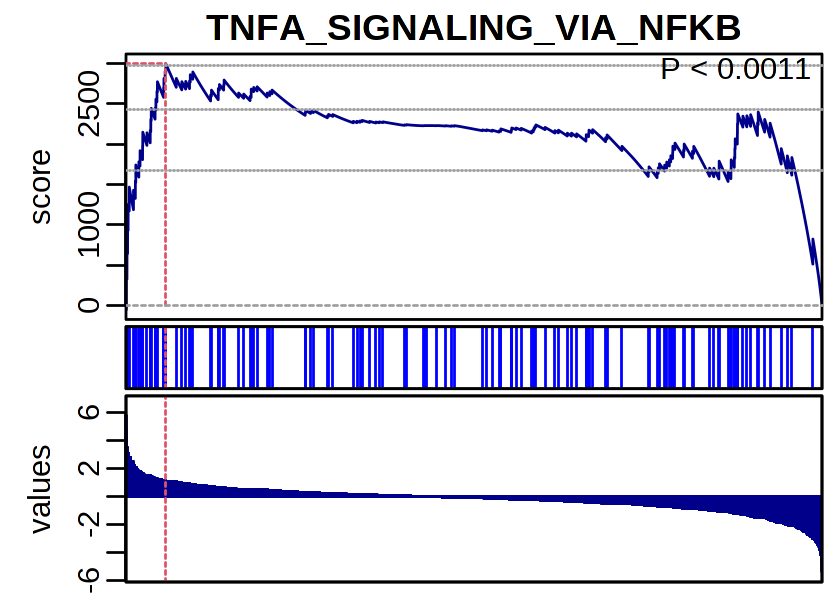

In [2143]:
options(repr.plot.width = 4.2, repr.plot.height = 3, repr.plot.res = 200)

for (gs in c('MTORC1_SIGNALING', 'TNFA_SIGNALING_VIA_NFKB')) {

    gsea(
        values = fold_changes %>% 
            filter(gene %in% expressed_genes) %>%
            filter(!is.infinite(logFC)) %>%
            {setNames(.$logFC, .$gene)},
        h_gene_sets[[gs]],
        main = str_remove(gs, 'HALLMARK_')
    )
    
}

#### **Within cluster clone 2 vs 3**

In [2127]:
sample = '27522_Primary'

de_annot = group_annot %>% filter(group %in% c('e1_c2', 'e1_c3'))

con_sample$getDifferentialGenes(
    groups = de_annot %>% {setNames(.$clone_opt, .$cell)}
)

fold_changes = make_psbulk(
        count_mat[[sample]],
        de_annot %>% mutate(cell_type = factor(clone_opt, c(3,2)))
    )$exp_mat %>%
    data.frame() %>%
    setNames(c('lambda_x', 'lambda_y')) %>%
    tibble::rownames_to_column('gene') %>%
    mutate(logFC = log2(lambda_x/lambda_y)) %>%
    filter(!is.na(logFC))

Warning message in con_sample$getDifferentialGenes(groups = de_annot %>% {:
“cluster vector doesn't specify groups for all of the cells, dropping missing cells from comparison”
1169430



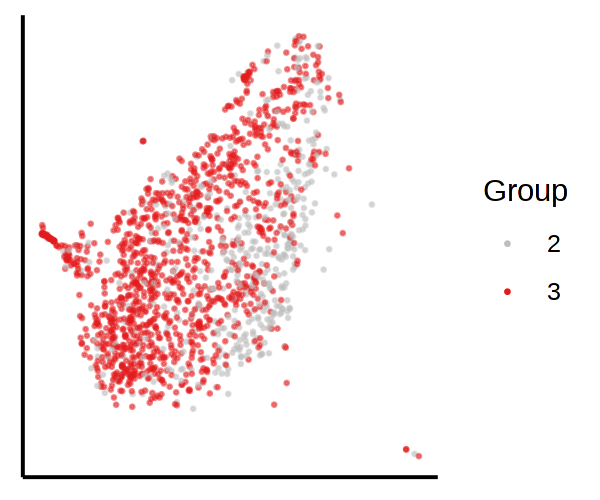

In [2128]:
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 200)

con_sample$plotEmbedding(
    alpha=0.5,
    size=0.2, 
    groups = de_annot %>% {setNames(.$clone_opt, .$cell)},
    plot.na = F,
    show.legend = T,
    mark.groups = F,
    palette = c('gray', pal[1:3]),
    plot.theme = theme_classic(),
#     title = 'genetic clone'
) 

Warning message:
“ggrepel: 87 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


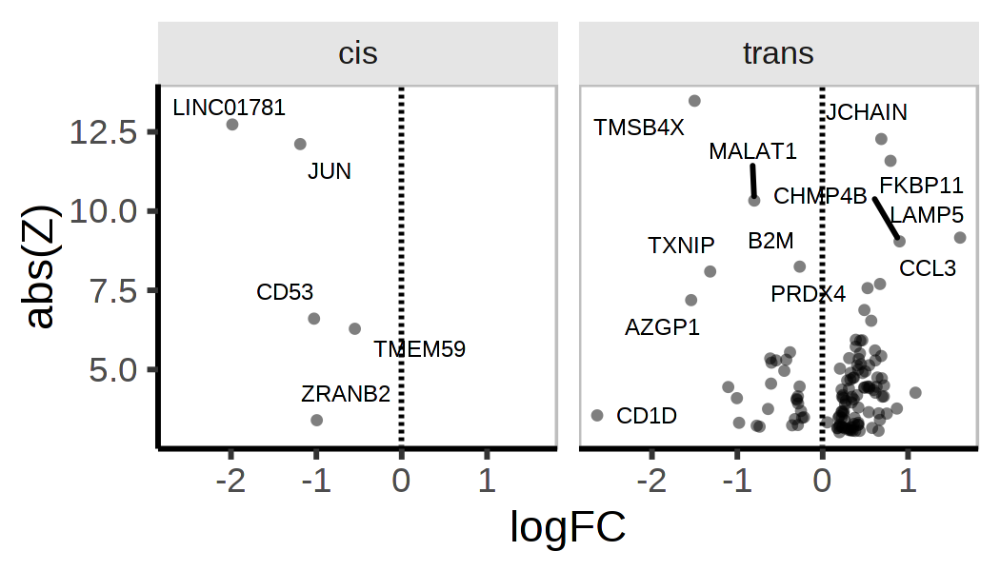

In [2130]:
options(repr.plot.width = 3.5, repr.plot.height = 2, repr.plot.res = 300)

seg_start = 52085411
seg_end = 144887191

DE = con_sample$diffgenes$counts$customClustering[[1]] %>%
    tibble::rownames_to_column('gene') %>%
    inner_join(gtf_transcript, by = 'gene') %>%
    left_join(fold_changes, by = 'gene') %>%
    mutate(
        loc = ifelse(CHROM == 'chr1' & gene_start < seg_end & gene_end > seg_start, 'cis', 'trans')
    )

ggplot(
    DE,
    aes(x = logFC, y = abs(Z))
) +
geom_point(size = 1, alpha = 0.5, pch = 16) +
theme_classic() +
scale_color_manual(values = c('gray', 'red')) +
facet_wrap(~loc) +
geom_text_repel(aes(label = gene), size = 2) +
geom_vline(xintercept = 0, linetype = 'dashed') +
theme(
    panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
    strip.background = element_rect(fill = 'gray90', size = 0),
    strip.text = element_text(size = 8)
)

In [2131]:
DE %>% count(loc)

loc,n
<chr>,<int>
cis,5
trans,124


In [2132]:
expressed_genes = rownames(count_mat[[sample]])[rowSums(count_mat[[sample]][,de_annot$cell] > 0) >= 5]
# expressed_genes = rownames(count_mat[[sample]])[rowMeans(count_mat[[sample]][,de_annot$cell] > 0) > 0.05]

gsea_out = bulk.gsea(
    values = fold_changes %>% 
        filter(gene %in% expressed_genes) %>%
        filter(!is.infinite(logFC)) %>% 
        {setNames(.$logFC, .$gene)},
    set.list = h_gene_sets,
    mc.cores = 10
)

In [2133]:
gsea_out %>%
tibble::rownames_to_column('gene.set') %>%
filter(q.val < 0.05 & sscore * edge > 0) %>%
arrange(q.val, -sscore)

gene.set,p.val,q.val,sscore,edge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
E2F_TARGETS,0.00009999,0.000000000,3.504827,0.5113716
G2M_CHECKPOINT,0.00009999,0.000000000,3.134677,0.6390628
MITOTIC_SPINDLE,0.00009999,0.000000000,2.073100,0.7856114
SPERMATOGENESIS,0.00089991,0.004672727,1.203668,1.7691233
ESTROGEN_RESPONSE_LATE,0.00319968,0.012446154,1.116811,0.1147767


In [1944]:
gsea_out %>%
tibble::rownames_to_column('gene.set') %>%
filter(q.val < 0.05 & sscore * edge > 0) %>%
arrange(q.val, -sscore)

gene.set,p.val,q.val,sscore,edge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
E2F_TARGETS,0.00009999,0.000000000,3.504827,0.5113716
G2M_CHECKPOINT,0.00009999,0.000000000,3.134677,0.6390628
MITOTIC_SPINDLE,0.00009999,0.000000000,2.073100,0.7856114
SPERMATOGENESIS,0.00089991,0.004672727,1.203668,1.7691233
ESTROGEN_RESPONSE_LATE,0.00319968,0.012446154,1.116811,0.1147767


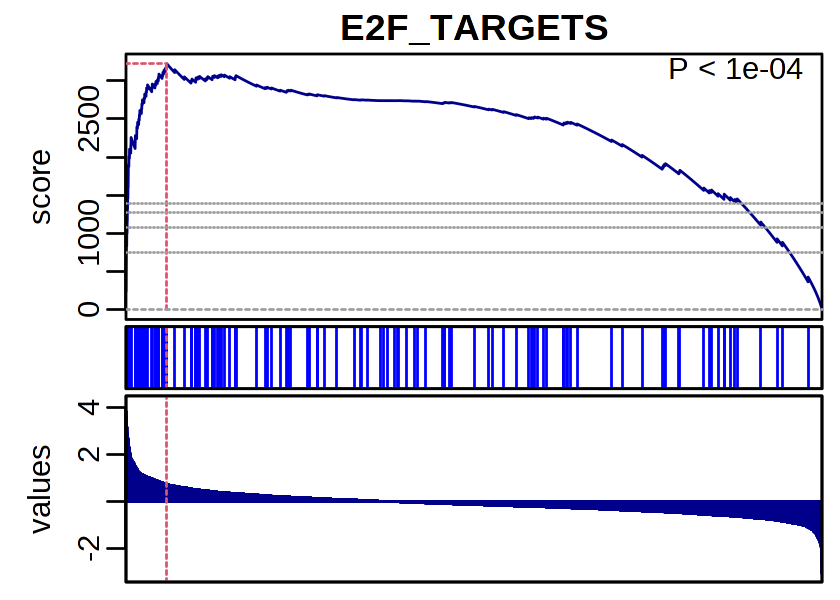

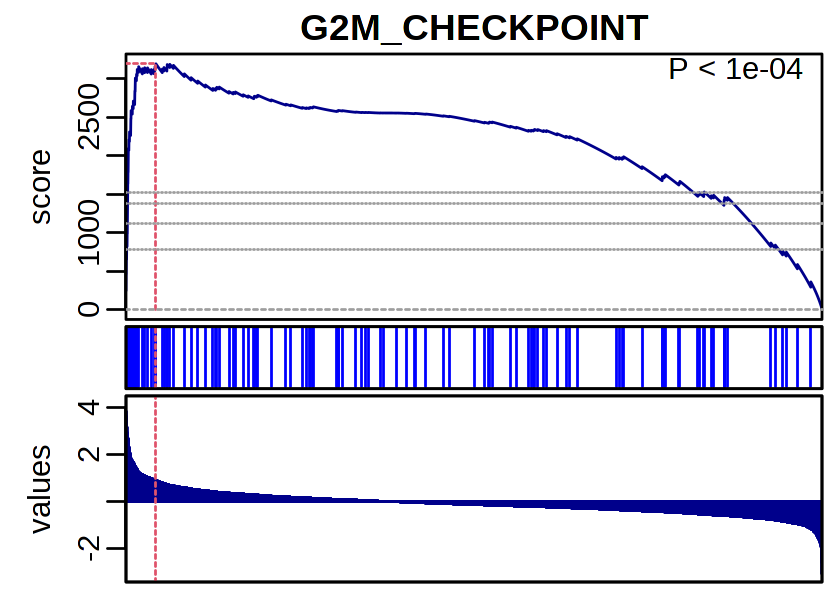

In [1681]:
options(repr.plot.width = 4.2, repr.plot.height = 3, repr.plot.res = 200)

for (gs in c('E2F_TARGETS', 'G2M_CHECKPOINT')) {

    gsea(
        fold_changes %>% 
            filter(gene %in% expressed_genes) %>%
            filter(!is.infinite(logFC)) %>%
            {setNames(.$logFC, .$gene)},
        h_gene_sets[[gs]],
        main = str_remove(gs, 'HALLMARK_')
    )
    
}

In [1524]:
seg_start = 52085411
seg_end = 121518467
region_mb = seg_end - seg_start

gtf_transcript %>% filter(gene %in% h_gene_sets[['G2M_CHECKPOINT']])  %>%
count(CHROM == 'chr1' & gene_start > 52085411 & gene_end < 121518467) 

binom.test(x = 4, n = 200, p = region_mb/genome_size)

"CHROM == ""chr1"" & gene_start > 52085411 & gene_end < 121518467",n
<lgl>,<int>
FALSE,196
TRUE,4



	Exact binomial test

data:  4 and 200
number of successes = 4, number of trials = 200, p-value = 1
alternative hypothesis: true probability of success is not equal to 0.02248283
95 percent confidence interval:
 0.005475566 0.050413609
sample estimates:
probability of success 
                  0.02 


#### **Clone 2 vs 4**

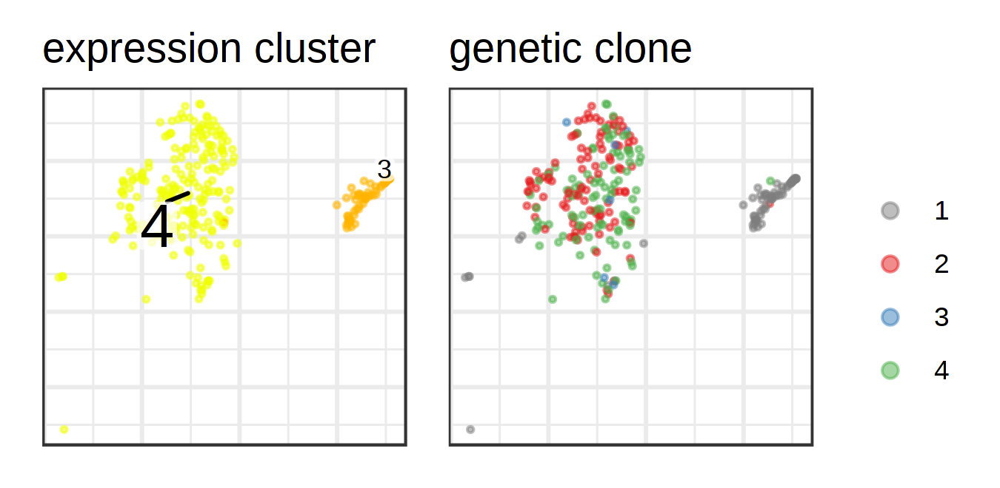

In [1958]:
options(repr.plot.width = 4.5, repr.plot.height = 2.2, repr.plot.res = 300)

sample = '27522_Relapse_2'

# expression clusters
con_sample = con$samples[[sample]]

con_clusters = con_sample$clusters$PCA$multilevel
con_clusters = con_clusters[names(con_clusters) %in% res$clone_post$cell]
con_clusters = con_clusters[con_clusters %in% c(3,4)]

clone_annot = res$clone_post %>%
    mutate(cluster = con_clusters[cell]) %>%
    filter(!is.na(cluster))

p1 = con_sample$plotEmbedding(
        alpha=0.5,
        size=0.5, 
        groups = con_clusters,
        show.legend = F,
        plot.na = F,
        plot.theme = theme_bw(),
        title = 'expression cluster'
    ) +
    guides(color = guide_legend(title = 'cluster'))

p2 = con_sample$plotEmbedding(
    alpha=0.5,
    size=0.5, 
    groups = clone_annot %>% {setNames(.$clone_opt, .$cell)},
    plot.na = F,
    show.legend = T,
    mark.groups = F,
    palette = c('gray50', pal[1:3]),
    plot.theme = theme_bw(),
    title = 'genetic clone'
) +
guides(color = guide_legend(title = '', override.aes = list(size = 2))) 

p1 | p2

Warning message in con_sample$getDifferentialGenes(groups = de_annot %>% {:
“cluster vector doesn't specify groups for all of the cells, dropping missing cells from comparison”
99101



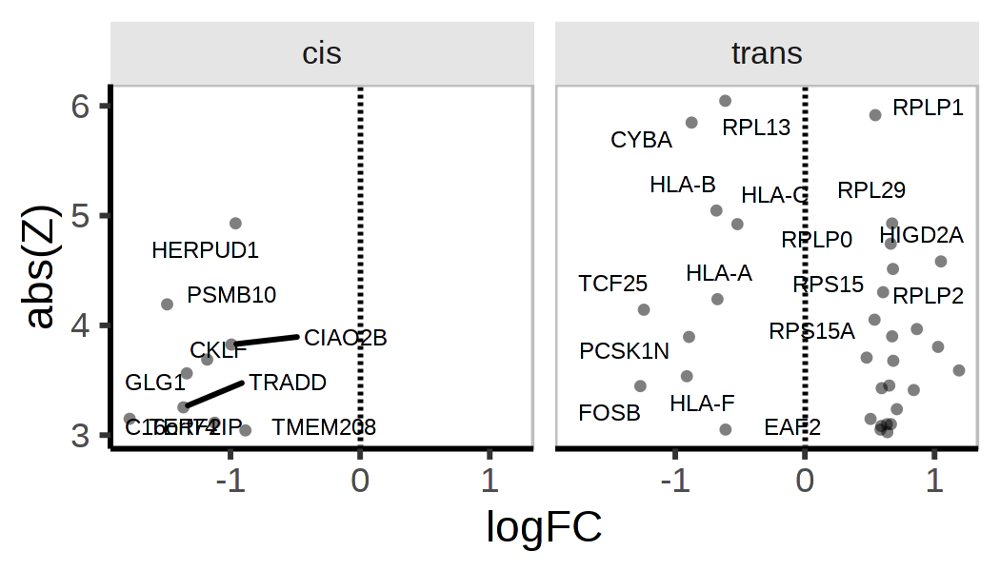

In [1959]:
options(repr.plot.width = 3.5, repr.plot.height = 2, repr.plot.res = 300)

# DE
de_annot = clone_annot %>% filter(clone_opt %in% c(2,4))

con_sample = con$samples[['27522_Relapse_2']]

con_sample$getDifferentialGenes(
    groups = de_annot %>% {setNames(.$clone_opt, .$cell)}
)

fold_changes = make_psbulk(
        count_mat[[sample]],
        de_annot %>% mutate(cell_type = factor(clone_opt, c(4,2)))
    )$exp_mat %>%
    data.frame() %>%
    setNames(c('lambda_x', 'lambda_y')) %>%
    tibble::rownames_to_column('gene') %>%
    mutate(logFC = log2(lambda_x/lambda_y)) %>%
    filter(!is.na(logFC) & !is.infinite(logFC))

# visualize
seg_start = 54009095
seg_end = 85723222

DE = con_sample$diffgenes$counts$customClustering[[1]] %>%
    tibble::rownames_to_column('gene') %>%
    inner_join(gtf_transcript, by = 'gene') %>%
    left_join(fold_changes, by = 'gene') %>%
    mutate(loc = ifelse(CHROM == 'chr16' & gene_start < seg_end & gene_end > seg_start, 'cis', 'trans'))

ggplot(
    DE,
    aes(x = logFC, y = abs(Z))
) +
geom_point(size = 1, alpha = 0.5, pch = 16) +
theme_classic() +
scale_color_manual(values = c('gray', 'red')) +
facet_wrap(~loc) +
geom_text_repel(aes(label = gene), size = 2) +
geom_vline(xintercept = 0, linetype = 'dashed') +
theme(
    panel.border = element_rect(size = 0.5, color = 'gray', fill = NA),
    strip.background = element_rect(fill = 'gray90', size = 0),
    strip.text = element_text(size = 8)
)

In [1982]:
dat = fold_changes %>% 
    filter(gene %in% expressed_genes) %>%
    filter(!is.infinite(logFC)) %>% 
    {setNames(.$logFC, .$gene)} 

In [2012]:
expressed_genes = rownames(count_mat[[sample]])[rowSums(count_mat[[sample]][,de_annot$cell] > 0) >= 5]

gsea_out = bulk.gsea(
    values = fold_changes %>% 
        filter(gene %in% expressed_genes) %>%
        filter(!is.infinite(logFC)) %>% 
        {setNames(.$logFC, .$gene)},
    set.list = h_gene_sets,
    n.rand = 1e4,
    mc.cores = 10
)

In [1993]:
saveRDS(dat, '~/logFC.rds')

In [2011]:
saveRDS(h_gene_sets, '~/geneset.rds')

In [2013]:
gsea_out %>%
tibble::rownames_to_column('gene.set') %>%
filter(q.val < 0.05 & sscore * edge > 0) %>%
arrange(q.val, -sscore)

gene.set,p.val,q.val,sscore,edge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
INTERFERON_GAMMA_RESPONSE,0.00029997,0.0080,-1.288305,-0.2995351
INTERFERON_ALPHA_RESPONSE,0.00179982,0.0177,-1.172105,-0.4057007


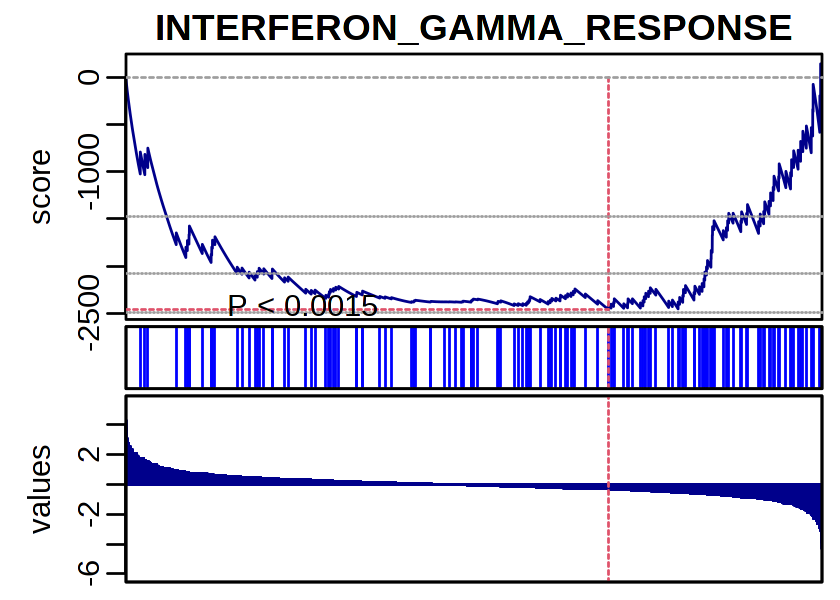

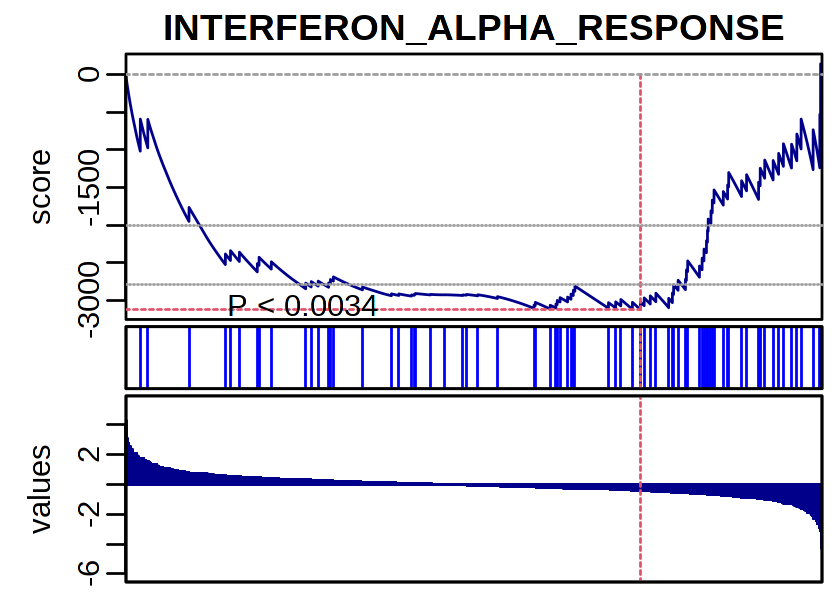

In [2004]:
options(repr.plot.width = 4.2, repr.plot.height = 3, repr.plot.res = 200)

for (gs in c('INTERFERON_GAMMA_RESPONSE', 'INTERFERON_ALPHA_RESPONSE')) {

    gsea(
        dat,
        unique(h_gene_sets[[gs]]),
        n.rand = 1e4,
        main = str_remove(gs, 'HALLMARK_')
    )
    
}

In [625]:
pathway = 'KRAS_SIGNALING_UP'
pathway_scores = as.matrix(con_sample$counts)[clone_annot$cell, intersect(h_gene_sets[[pathway]], colnames(con_sample$counts))] %>% rowSums %>% scale %>% {setNames(.[,1], rownames(.))}

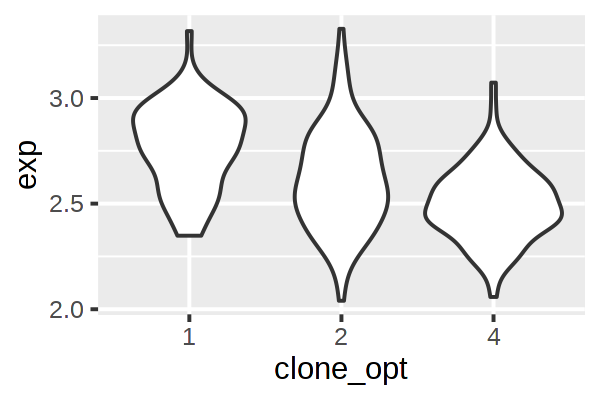

In [1540]:
options(repr.plot.width = 3, repr.plot.height = 2, repr.plot.res = 200)

pathway = 'INTERFERON_GAMMA_RESPONSE'

as.matrix(con_sample$counts)[clone_annot$cell, intersect(h_gene_sets[[pathway]], colnames(con_sample$counts))] %>%
rowSums %>% 
{log(.+1e-6)} %>%
# scale %>%
as.data.frame() %>%
tibble::rownames_to_column('cell') %>%
setNames(c('cell', 'exp')) %>%
left_join(clone_annot, by = 'cell') %>%
filter(clone_opt %in% c(1,2,4)) %>%
mutate(clone_opt = as.character(clone_opt)) %>%
ggplot(
    aes(x = clone_opt, y = exp)
) +
geom_violin()

In [686]:
count_mat_combined = lapply(samples, function(sample) {con$samples[[sample]]$counts}) %>% Reduce('rbind', .) %>% as.matrix

In [699]:
plasma_cells = bind_rows(cell_annot[samples]) %>% filter(cell_type == 'Plasma') %>% pull(cell)
plasma_cells = intersect(plasma_cells, rownames(count_mat_combined))

In [1542]:
gsea_out %>%
tibble::rownames_to_column('gene.set') %>%
filter(q.val < 0.1) %>%
arrange(q.val, sscore)

gene.set,p.val,q.val,sscore,edge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
INTERFERON_GAMMA_RESPONSE,0.00009999,0.00000000,-1.6630989,-0.5499286
INTERFERON_ALPHA_RESPONSE,0.00019998,0.00030000,-1.4582965,-0.5255222
KRAS_SIGNALING_UP,0.00309969,0.04645000,-1.1101576,-0.7439791
UV_RESPONSE_DN,0.00439956,0.04645000,-1.0729247,-0.3614295
OXIDATIVE_PHOSPHORYLATION,0.00379962,0.07480000,1.1035853,-0.3321089
EPITHELIAL_MESENCHYMAL_TRANSITION,0.00399960,0.08273333,1.0685099,0.5665141
MYC_TARGETS_V1,0.00189981,0.08273333,1.1281134,-0.4143236
PROTEIN_SECRETION,0.01109889,0.08903333,-0.9916605,-0.1229612


In [1537]:
length(h_gene_sets[['INTERFERON_GAMMA_RESPONSE']])

[1] 284

In [1581]:
DE %>% 
filter(loc == 'cis') %>%
filter(gene %in% h_gene_sets[['INTERFERON_GAMMA_RESPONSE']])

gene,Z,M,highest,fe,Gene,Specificity,Precision,ExpressionFraction,gene_start,gene_end,CHROM,region,gene_length,lambda_x,lambda_y,logFC,loc
<chr>,<dbl>,<dbl>,<lgl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<int>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<chr>
PSMB10,4.191319,0.5441654,TRUE,0.7722772,PSMB10,0.5819672,0.6046512,0.7722772,67934507,67936850,chr16,chrchr16:67934507-67936850,2343,4.77268e-05,0.0001339438,-1.488756,cis


In [1584]:
gtf_transcript %>%
filter(gene %in% h_gene_sets[['INTERFERON_GAMMA_RESPONSE']]) %>%
count(CHROM == 'chr16' & gene_start > 54009095 & gene_end < 85723222)

"CHROM == ""chr16"" & gene_start > 54009095 & gene_end < 85723222",n
<lgl>,<int>
FALSE,196
TRUE,4


In [1585]:
region_mb = (85723222 - 54009095)
prop.test(x = 4, n = 200, p = region_mb/genome_size)

Warning message in prop.test(x = 4, n = 200, p = region_mb/genome_size):
“Chi-squared approximation may be incorrect”



	1-sample proportions test with continuity correction

data:  4 out of 200, null probability region_mb/genome_size
X-squared = 1.0288, df = 1, p-value = 0.3104
alternative hypothesis: true p is not equal to 0.01026922
95 percent confidence interval:
 0.006426013 0.053757461
sample estimates:
   p 
0.02 


### GSEA

In [144]:
library(liger)

In [2006]:
h_gene_sets = msigdbr::msigdbr(species = "human", category = "H") %>%
    split(.$gs_name) %>%
    lapply(function(x) {unique(x$gene_symbol)})

names(h_gene_sets) = str_remove(names(h_gene_sets), 'HALLMARK_')

#### Plotting

In [1644]:
gsea = function (values, geneset, power = 1, rank = FALSE, weight = rep(1, 
    length(values)), n.rand = 10000, plot = TRUE, main = "", 
    return.details = FALSE, quantile.threshold = min(100/n.rand, 
        0.1), random.seed = 1, mc.cores = 1) 
{
    set <- names(values) %in% geneset
    vo <- order(values, decreasing = TRUE)
    values <- values[vo]
    set <- set[vo]
    weight <- weight[vo]
    if (rank) {
        es <- weight
    }
    else {
        es <- (abs(values)^power) * weight
    }
    eso <- es
    es[set] <- es[set]/sum(es[set])
    es[!set] <- -1 * es[!set]/sum(es[!set])
    es <- es * length(values)
    sv <- cumsum(es)
    sv.p <- max(0, max(sv))
    sv.n <- min(0, min(sv))
    p.x.p <- which.max(sv)
    p.x.n <- which.min(sv)
    if (mc.cores > 1) {
        rvll <- parallel::mclapply(1:mc.cores, function(i) {
            set.seed(random.seed + i)
            gseaRandCore(set, eso, nsamples = ceiling(n.rand/mc.cores))
        }, mc.preschedule = TRUE, mc.cores = mc.cores)
        rvl <- list(p = unlist(lapply(rvll, function(x) x$p)), 
            n = unlist(lapply(rvll, function(x) x$n)))
    }
    else {
        set.seed(random.seed)
        rvl <- liger:::gseaRandCore(set, eso, nsamples = n.rand)
    }
    p.v.p <- (sum(rvl$p >= sv.p) + 1)/(length(rvl$p + 1))
    p.v.n <- (sum(rvl$n <= sv.n) + 1)/(length(rvl$n + 1))
    p.x <- ifelse(p.v.p < p.v.n, p.x.p, p.x.n)
    p.v <- ifelse(p.v.p < p.v.n, p.v.p, p.v.n)
    if (p.v.p < p.v.n) {
        q.thr <- stats::quantile(rvl$p, p = (1 - quantile.threshold))
    }
    else {
        q.thr <- stats::quantile(rvl$n, p = quantile.threshold)
    }
    if (plot) {
        l <- graphics::layout(matrix(c(1, 2, 3), 3, 1, byrow = T), 
            c(1, 1, 1), c(1.4, 0.3, 0.9), FALSE)
        graphics::par(mar = c(0.1, 3.5, 1.5, 0.5), mgp = c(2, 
            0.65, 0), cex = 0.9)
        plot(c(1:length(sv)), sv, type = "l", ylab = "score", 
            xaxt = "n", xlab = "", main = main, xaxs = "i", xlim = c(1, 
                length(sv)), col = "darkblue")
        graphics::segments(p.x, 0, p.x, sv[p.x], col = 2, lty = 2)
        graphics::segments(0, sv[p.x], p.x, sv[p.x], col = 2, 
            lty = 2)
        qv.p <- stats::quantile(rvl$p, p = 1 - 10^(-1 * seq(1, 
            round(log10(length(rvl$p))))))
        qv.n <- -1 * stats::quantile(-1 * rvl$n, p = 1 - 10^(-1 * 
            seq(1, round(log10(length(rvl$n))))))
        graphics::abline(h = c(qv.p, qv.n), lty = 3, col = 8)
        graphics::abline(h = 0, lty = 2, col = 8)
        xpos <- "right"
        if (p.x > round(length(sv)/2)) {
            xpos <- "left"
        }
        graphics::legend(x = ifelse(sv[round(length(sv)/2)] > 
            sv[p.x], paste("bottom", xpos, sep = ""), paste("top", 
            xpos, sep = "")), bty = "n", legend = paste("P <", 
            format(p.v, digits = 3)), inset=c(0.1,0))
        graphics::par(mar = c(0.1, 3.5, 0.1, 0.5))
        mset <- set
        mset[!set] <- NA
        plot(mset, xaxt = "n", ylim = c(0, 1), xlab = "", ylab = "", 
            xaxs = "i", yaxt = "n", type = "h", col = "blue")
        graphics::abline(v = p.x, col = 2, lty = 2)
        graphics::box()
        graphics::par(mar = c(0.5, 3.5, 0.1, 0.5))
        plot(values, ylab = "values", xaxs = "i", type = "h", 
            xaxt = "n", col = "darkblue")
#         graphics::legend(x = "topright", bty = "n", legend = paste("edge value = ", 
#             format(values[p.x], digits = 2)))
        graphics::abline(v = p.x, col = 2, lty = 2)
        graphics::box()
    }
    if (return.details) {
        rv <- c(p.val = p.v, edge.score = as.numeric(sv[p.x]), 
            edge.value = as.numeric(values[p.x]), scaled.score = as.numeric(sv[p.x]/q.thr))
        return(rv)
    }
    else {
        return(p.v)
    }
}

In [903]:
# get_term = function(id) {
#     go = GO.db::GOTERM[[id]]
#     if (!is.null(go)) {
#         return(go@Term)
#     } else {
#         return(NA)
#     }
# }

# go_terms = data.frame(
#     term = sapply(names(org.Hs.GO2Symbol.list), function(id) {get_term(id = id)}),
#     id = names(org.Hs.GO2Symbol.list)
# )
# go_terms %>% fwrite('~/go_terms.tsv', sep = '\t')

In [503]:
GO.db::GOTERM[['GO:0000184']]@Term

[1] "nuclear-transcribed mRNA catabolic process, nonsense-mediated decay"

Warning message:
“Removed 70 rows containing missing values (geom_point).”
Warning message:
“Removed 16 rows containing missing values (geom_point).”
Warning message:
“Removed 2 rows containing missing values (geom_point).”


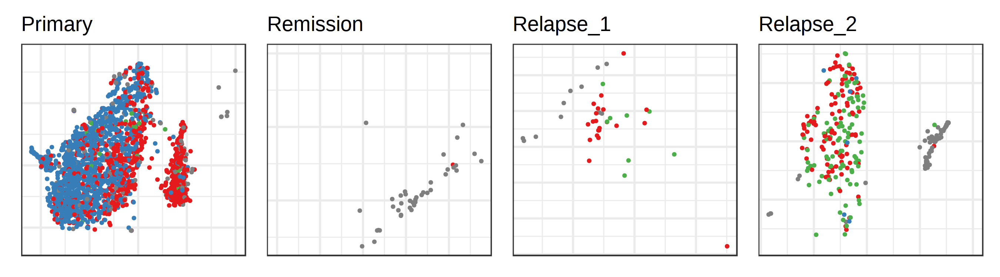

In [1445]:
options(repr.plot.width = 9, repr.plot.height = 2.5, repr.plot.res = 300)

size = 0.5
alpha = 1

sample = '27522_Primary'

p1 = con$samples[[sample]]$plotEmbedding(
    alpha=alpha,
    size=size, 
    palette = c('gray50', pal[1:3]),
    groups = res$clone_post %>% {setNames(.$clone , .$cell)},
    show.legend = F,
    mark.groups = F,
    plot.na = F,
    plot.theme = theme_bw(),
    title.size = 3,
    title = str_remove(sample, '27522_')
) +
# theme_bw() +
xlim(NA, 10) +
ylim(-13, 18) +
guides(colour = guide_legend(override.aes = list(size = 2), title = 'clone'))


sample = '27522_Remission'

p2 = con$samples[[sample]]$plotEmbedding(
    alpha=alpha,
    size=size, 
    palette = c('gray50', pal[1:3]),
    groups = res$clone_post %>% {setNames(.$clone_opt, .$cell)},
    show.legend = F,
    mark.groups = F,
    plot.na = F,
    plot.theme = theme_bw(),
    title.size = 3,
    title = str_remove(sample, '27522_')
) +
# theme_bw() +
ylim(NA, -25) +
xlim(-16, NA) +
guides(colour = guide_legend(override.aes = list(size = 2), title = 'clone'))

sample = '27522_Relapse_1'

p3 = con$samples[[sample]]$plotEmbedding(
    alpha=alpha,
    size=size, 
    palette = c('gray50', pal[1:3]),
    groups = res$clone_post %>% {setNames(.$clone_opt, .$cell)},
    show.legend = F,
    mark.groups = F,
    plot.na = F,
    plot.theme = theme_bw(),
    title.size = 3,
    title = str_remove(sample, '27522_')
) +
# xlim(27, NA) +
# ylim(-10, NA) +
guides(colour = guide_legend(override.aes = list(size = 2), title = 'clone'))

sample = '27522_Relapse_2'

p4 = con$samples[[sample]]$plotEmbedding(
    alpha=alpha,
    size=size, 
    palette = c('gray50', pal[1:3]),
    groups = res$clone_post %>% {setNames(.$clone_opt, .$cell)},
    show.legend = F,
    mark.groups = F,
    plot.na = F,
    plot.theme = theme_bw(),
    title.size = 3,
    title = str_remove(sample, '27522_')
) +
# theme_bw() +
xlim(NA, 20) +
ylim(33, NA) +
guides(colour = guide_legend(override.aes = list(size = 2), title = 'clone'))

p1 | p2 | p3 | p4

In [1065]:
con_27522 = readRDS('~/external/WASHU/con_27522.rds')

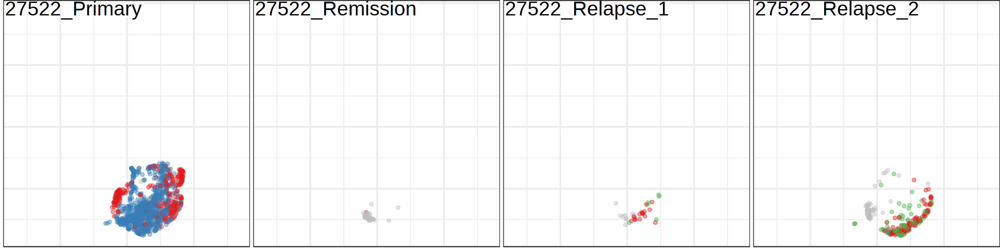

In [1155]:
options(repr.plot.width = 12, repr.plot.height = 3, repr.plot.res = 200)

con_27522$plotPanel(
    groups = res$clone_post %>%
        mutate(cluster = con_27522$clusters$leiden$groups[cell]) %>%
        filter(cluster == 1) %>%
        filter(p_opt > 0.9) %>%
        {setNames(.$clone_opt, .$cell)},
    plot.na = F,
    pal = c('gray', pal),
    size = 1,
    mark.groups = F,
    use.common.embedding = T,
    nrow = 1
)

### Clonal dynamics

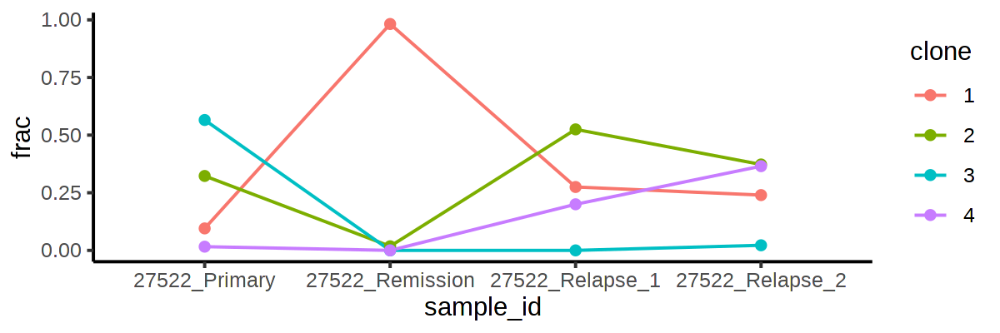

In [1267]:
options(repr.plot.width = 6, repr.plot.height = 2, repr.plot.res = 200)

frac_table = res$clone_post %>%
    mutate(clone = factor(clone_opt)) %>%
    mutate(cluster = con_clusters[cell]) %>%
    inner_join(bind_rows(cell_annot[samples]), by = 'cell') %>%
    mutate(sample_id = factor(sample_id, samples)) %>%
    count(sample_id, clone) %>%
    group_by(sample_id) %>%
    mutate(frac = n/sum(n)) %>%
    ungroup() %>%
    tidyr::complete(sample_id, clone, fill = list('n' = 0, 'frac' = 0)) 

frac_table %>%
ggplot(
    aes(x = sample_id, y = frac, color = clone, group = clone)
) +
theme_classic() +
geom_line() +
geom_point()

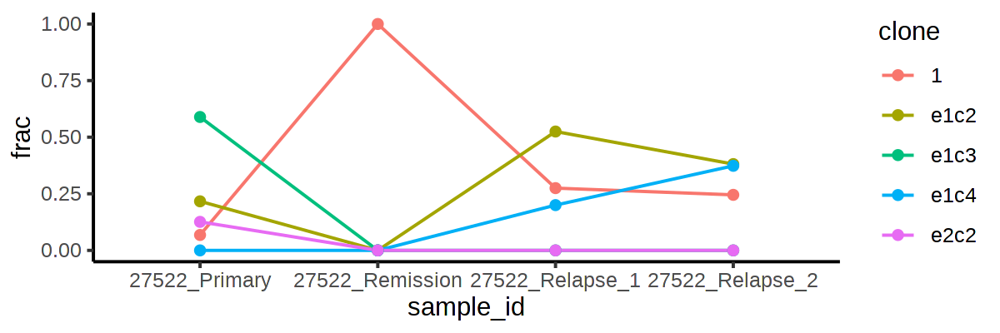

In [2116]:
options(repr.plot.width = 6, repr.plot.height = 2, repr.plot.res = 200)

frac_table = res$clone_post %>%
    mutate(clone = factor(clone_opt)) %>%
    mutate(cluster = con_clusters[cell]) %>%
    inner_join(bind_rows(cell_annot[samples]), by = 'cell') %>%
    mutate(sample_id = factor(sample_id, samples)) %>%
    mutate(clone = ifelse(sample_id == '27522_Primary' & clone != 1, paste0('e', cluster, 'c', clone), clone)) %>%
    mutate(clone = ifelse(sample_id != '27522_Primary' & clone != 1, paste0('e1c', clone), clone)) %>%
    filter(!(sample_id == '27522_Primary' & is.na(cluster))) %>%
    count(sample_id, clone) %>%
    group_by(sample_id) %>%
    mutate(frac = n/sum(n)) %>%
    filter(frac > 0.05) %>%
    mutate(frac = n/sum(n)) %>%
    ungroup() %>%
    tidyr::complete(sample_id, clone, fill = list('n' = 0, 'frac' = 0)) 

frac_table %>%
ggplot(
    aes(x = sample_id, y = frac, color = clone, group = clone)
) +
theme_classic() +
geom_line() +
geom_point()

In [2117]:
timepoints = setNames(c(0, 1.1, 2.85, 3.15), str_remove(samples, '27522_'))      

frac_table_wide = frac_table %>%
    reshape2::dcast(clone ~ sample_id, value.var = 'frac') %>%
    tibble::column_to_rownames('clone') %>%
    as.matrix

frac_trunc = colSums(frac_table_wide[2:5,])
frac_c2 = colSums(frac_table_wide[2:4,])
frac_table_wide['e1c3',] = frac_table_wide['e1c3',] + 1e-4

frac_table_wide[2,] = frac_c2
frac_table_wide = frac_table_wide %>% rbind(frac_trunc)

parents = c(0,6,2,2,6,0)

[1] "WARNING: there were not 3 background gradient colors set - falling back to defaults"


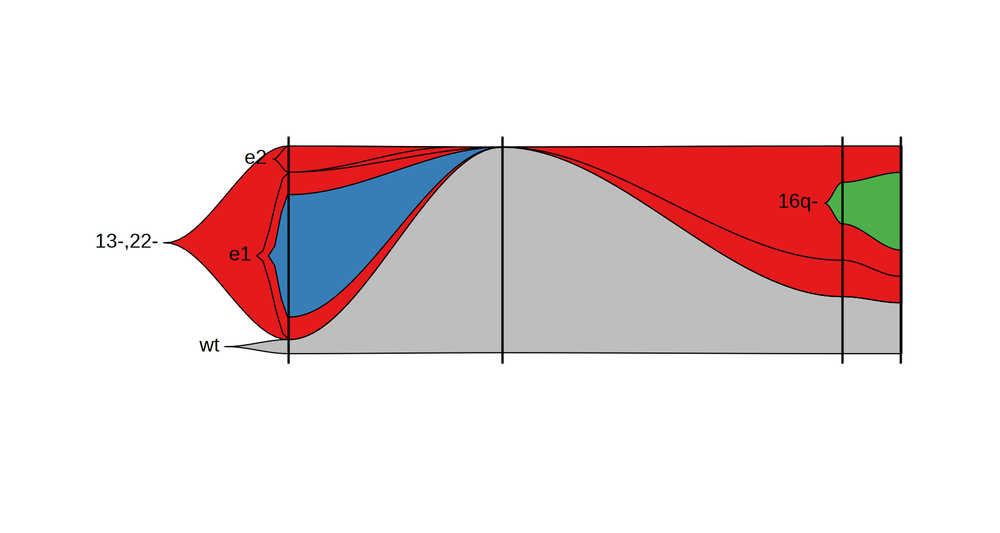

In [2118]:
options(repr.plot.width = 6, repr.plot.height = 3.2, repr.plot.res = 300)

pal = RColorBrewer::brewer.pal(n = 8, 'Set1')

frac_table_wide[,'27522_Remission'] = c(0.99, 0.001, 0.0001, 0, 0, 0.001)

fish = fishplot::createFishObject(
    frac_table_wide * 99, parents,
    timepoints = timepoints, 
#     fix.missing.clones=TRUE, 
    col = c('gray', pal[1], pal[2:3], pal[1], pal[1]),
    clone.annots = c('wt', 'e1', '', '16q-', 'e2', '13-,22-')
)

#calculate the layout of the drawing
fish = fishplot::layoutClones(fish)

fishplot::fishPlot(
#     ramp.angle = 1,
    fish,
    shape="spline",
    vlines = timepoints,
#     vlab = names(timepoints),
    cex.vlab = 0.4,
    bg.col = 'white',
    bg.type = 's',
#     border = 0.9,
    col.border = 'black',
    col.vline = 'black'
)

In [ ]:
timepoints = setNames(c(0, 1.1, 2.85, 3.15), str_remove(samples, '27522_'))      

frac_table_wide = frac_table %>%
    reshape2::dcast(clone ~ sample_id, value.var = 'frac') %>%
    tibble::column_to_rownames('clone') %>%
    as.matrix

frac_table_wide[4,'27522_Primary'] = 0
frac_table_wide[3,'27522_Relapse_2'] = 0
frac_table_wide[3,'27522_Relapse_1'] = 0

frac_table_wide[2,] = colSums(frac_table_wide[2:4,])

parents = c(0,0,2,2)

[1] "WARNING: there were not 3 background gradient colors set - falling back to defaults"


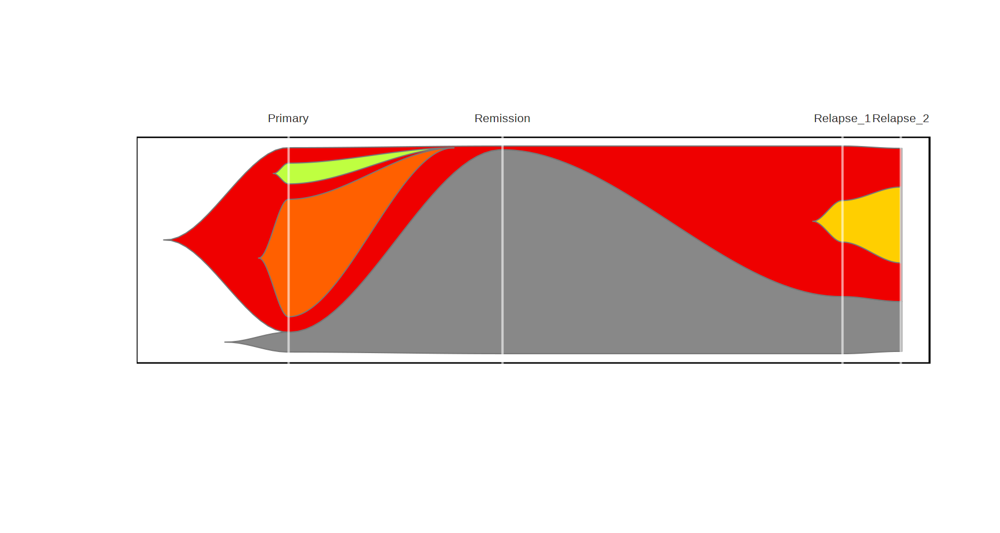

In [1304]:
options(repr.plot.width = 6, repr.plot.height = 3.2, repr.plot.res = 300)

pal = RColorBrewer::brewer.pal(n = 8, 'Set1')

fish = fishplot::createFishObject(
    frac_table_wide * 99, parents,
    timepoints = timepoints, fix.missing.clones=TRUE, 
    col = c('gray', pal[1:3]),
    clone.annots = c('wt', '13-,22-', '1-', '16q-')
)

#calculate the layout of the drawing
fish = fishplot::layoutClones(fish)

fishplot::fishPlot(
    fish,
    shape="spline",
    vlines = timepoints, 
    vlab = names(timepoints),
    cex.vlab = 0.4,
    bg.col = 'white',
    bg.type = 'solid'
)